In [1]:
% matplotlib inline
from __future__ import (division, 
                        print_function)

import os
import sys
import copy
import glob
import fnmatch
import warnings
import collections

import numpy as np
import scipy
try:
    from scipy.stats import scoreatpercentile
except:
    scoreatpercentile = False
from scipy.interpolate import interp1d
from scipy.ndimage import gaussian_filter
import cPickle as pickle

# Astropy
from astropy.io import fits
from astropy    import units as u
from astropy.stats import sigma_clip
from astropy.table import Table, Column, join
from astropy.utils.console import ProgressBar
from astropy.convolution import convolve, Box1DKernel

# AstroML
from astroML.plotting import hist
from astroML.density_estimation import KNeighborsDensity
try:
    from sklearn.neighbors import KernelDensity
    use_sklearn_KDE = True
except:
    import warnings
    warnings.warn("KDE will be removed in astroML version 0.3.  Please "
                  "upgrade to scikit-learn 0.14+ and use "
                  "sklearn.neighbors.KernelDensity.", DeprecationWarning)
    from astroML.density_estimation import KDE
    use_sklearn_KDE = False
from sklearn.neighbors import KDTree
from sklearn.neighbors import BallTree

# Matplotlib related
import matplotlib as mpl
mpl.style.use('classic')
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import Ellipse
from matplotlib.ticker import NullFormatter, MaxNLocator, FormatStrFormatter
from matplotlib.collections import PatchCollection

# Personal
import hscUtils as hUtil
#import galSBP
#import coaddCutoutGalfitSimple as gSimple 

# Cosmology
import cosmology
c=cosmology.Cosmo(H0=70.0, omega_m=0.3, omega_l=0.7, flat=1)

import emcee
import corner

# Color map 
from palettable.colorbrewer.sequential import Greys_9, OrRd_9, Blues_9, Purples_9, YlGn_9
BLK = Greys_9.mpl_colormap
ORG = OrRd_9.mpl_colormap
BLU = Blues_9.mpl_colormap
GRN = YlGn_9.mpl_colormap
PUR = Purples_9.mpl_colormap

# Personal tools
from hscUtils import songPlotSetup, removeIsNullCol
from hscUtils import confidence_interval, ma_confidence_interval_1d, confidence_interval_1d

import cPickle
from astroML.decorators import pickle_results
from astroML.density_estimation import XDGMM
from astroML.plotting.tools import draw_ellipse

## Constants
# SDSS pivot wavelength 
sdss_u_pivot = 3551.0
sdss_g_pivot = 4686.0
sdss_r_pivot = 6165.0
sdss_i_pivot = 7481.0
sdss_z_pivot = 8931.0

# HSC pivot wavelength 
hsc_g_pivot = 4782.2
hsc_r_pivot = 6101.7 
hsc_i_pivot = 7648.0 
hsc_z_pivot = 8883.0
hsc_y_pivot = 9750.8

hscFiltWave = np.asarray([hsc_g_pivot, hsc_r_pivot, hsc_i_pivot, hsc_z_pivot, hsc_y_pivot])

"""
Absolute magnitude of the Sun in HSC filters
Right now, just use the DES filters
"""
SUN_G = 5.08
SUN_R = 4.62
SUN_I = 4.52
SUN_Z = 4.52
SUN_Y = 4.51

# Solar stellar metallicity 
Z_SUN = 0.02

# definitions for the axes
left, width    = 0.15, 0.64
right          = left + width 
bottom, height = 0.13, 0.86
bottom_h = left_h = left + width + 0.02
recScat = [0.16, 0.11, 0.59, 0.88]
recHist = [0.75, 0.11, 0.24, 0.88]
SBP1 = [0.124, 0.085, 0.865, 0.33]
SBP2 = [0.124, 0.41, 0.865, 0.55]
EC1 = [0.19, 0.14, 0.65, 0.65]
EC2 = [0.19, 0.79, 0.65, 0.18]
EC3 = [0.84, 0.14, 0.157, 0.65]
REC = [0.12, 0.11, 0.87, 0.87]
COG1 = [0.143, 0.10, 0.850, 0.43]
COG2 = [0.143, 0.53, 0.850, 0.43]

# Universal RSMA array
RSMA_COMMON = np.arange(0.4, 4.2, 0.01)
RR50_COMMON = np.arange(0.0, 9.0, 0.01)
EMPTY = (RSMA_COMMON * np.nan)

# Color 
BLUE0 = "#92c5de"
BLUE1 = "#0571b0"
RED0 = "#f4a582"
RED1 = "#ca0020"
PURPLE0 = '#af8dc3'
PURPLE1 = '#762a83'
BROWN0 = '#bf812d'
BROWN1 = '#543005'
GREEN0 = '#7fbf7b'
GREEN1 = '#1b7837'

# Color maps for different filters
from palettable.colorbrewer.sequential import Blues_9, Greens_9, Reds_9, Purples_9, Greys_9
GCMAP = Blues_9.mpl_colormap
RCMAP = Greens_9.mpl_colormap
ICMAP = Reds_9.mpl_colormap
ZCMAP = Purples_9.mpl_colormap
YCMAP = Greys_9.mpl_colormap

# 3-sigma
SIGMA1 = 0.3173
SIGMA2 = 0.0455
SIGMA3 = 0.0027

#import seaborn as sns
#sns.set(color_codes=False)

# Location and Files

In [2]:
# Location of the data
homeDir = os.getenv('HOME')
synpipeDir = os.path.join(homeDir, 'astro4/synpipe/')
sampleDir = os.path.join(synpipeDir, 'sample/cosmos')

# Samples
cosPhoFile = os.path.join(sampleDir, 'cosmos_mag25.2_shuang_photo.fits')
cosHscFile = os.path.join(sampleDir, 'cosmos_mag25.2_shuang_photo_hscmatch.fits')

cosPho = Table.read(cosPhoFile, format='fits')
cosHsc = Table.read(cosHscFile, format='fits')

# Outputs 
figDir = os.path.join(synpipeDir, 'figure')
outDir = os.path.join(synpipeDir, 'outputs')
inDir = os.path.join(synpipeDir, 'inputs')

starDir = os.path.join(outDir, 'star')
galaxyDir = os.path.join(outDir, 'galaxy')

In [3]:
print("# The shuang_photo catalog:")
print("# Number of objects: %d" % len(cosPho))
print("# Columns:")
print(cosPho.colnames)

print("\n# The shuang_laige catalog:")
print("# Number of objects: %d" % len(cosHsc))
print("# Columns:")
print(cosHsc.colnames)

# The shuang_photo catalog:
# Number of objects: 58210
# Columns:
['ID', 'mag', 'sersic_n', 'reff', 'b_a', 'theta', 'MPFIT_STATUS_SERSIC', 'DOF_SERSIC', 'MAD_SERSIC', 'MAD_SERSIC_MASK', 'CHISQ_SERSIC', 'CHISQ_SERSIC_MASK', 'ra_cosmos', 'dec_cosmos', 'SUBARU_G', 'SUBARU_R', 'SUBARU_I', 'Y_MAG_AUTO', 'Y_MAGERR_AUTO', 'V_MAG_AUTO', 'V_MAGERR_AUTO', 'ip_MAG_AUTO', 'ip_MAGERR_AUTO', 'r_MAG_AUTO', 'r_MAGERR_AUTO', 'zp_MAG_AUTO', 'zp_MAGERR_AUTO', 'yHSC_MAG_AUTO', 'yHSC_MAGERR_AUTO', 'ID2006', 'ID2008', 'ID2013', 'PHOTOZ', 'TYPE', 'ZPDF', 'ZPDF_L68', 'ZPDF_H68', 'ZMINCHI2', 'MASS_MED', 'MASS_MED_MIN68', 'MASS_MED_MAX68', 'MASS_BEST', 'SFR_MED', 'SFR_MED_MIN68', 'SFR_MED_MAX68', 'SFR_BEST', 'SSFR_MED', 'SSFR_MED_MIN68', 'SSFR_MED_MAX68', 'SSFR_BEST']

# The shuang_laige catalog:
# Number of objects: 58210
# Columns:
['ID', 'mag', 'sersic_n', 'reff', 'b_a', 'theta', 'MPFIT_STATUS_SERSIC', 'DOF_SERSIC', 'MAD_SERSIC', 'MAD_SERSIC_MASK', 'CHISQ_SERSIC', 'CHISQ_SERSIC_MASK', 'ra_cosmos', 'dec_cosmo

In [4]:
iAcs = cosHsc['mag']

iHsc = cosHsc['icmodel_mag'] - cosHsc['a_i']
gHsc = cosHsc['gcmodel_mag'] - cosHsc['a_g']
rHsc = cosHsc['rcmodel_mag'] - cosHsc['a_r']
zHsc = cosHsc['zcmodel_mag'] - cosHsc['a_z']
yHsc = cosHsc['ycmodel_mag'] - cosHsc['a_y']

gCos = cosHsc['SUBARU_G']
rCos = cosHsc['r_MAG_AUTO']
iCos = cosHsc['ip_MAG_AUTO']
zCos = cosHsc['zp_MAG_AUTO']
yCos = cosHsc['yHSC_MAG_AUTO']

redCos = cosHsc['PHOTOZ']
redHsc = cosHsc['specz_redshift']

# Comparisons of magnitudes

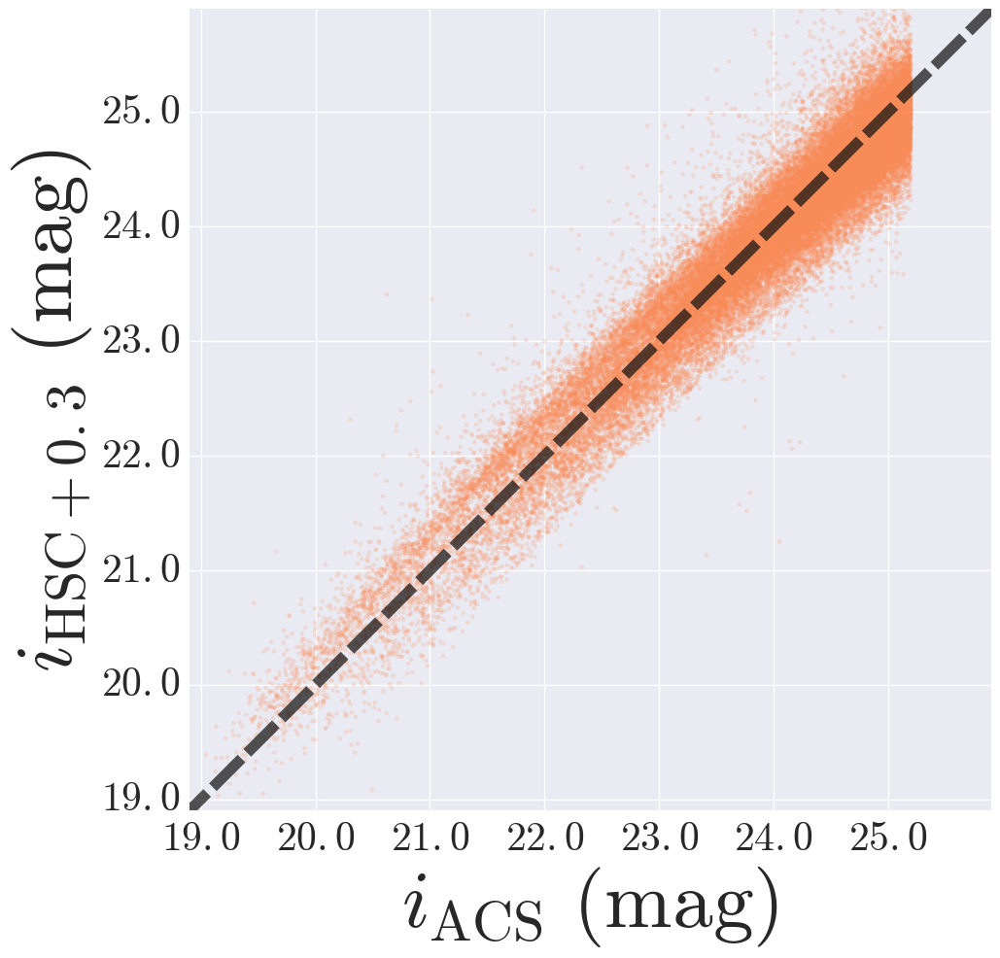

In [87]:
xx, yy = iAcs, iHsc

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy+0.3, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
lin = np.linspace(15.0, 28.0, 100)
ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$i_{\mathrm{ACS}}\ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$i_{\mathrm{HSC}+0.3}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(18.9, 25.9)
ax1.set_ylim(18.9, 25.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

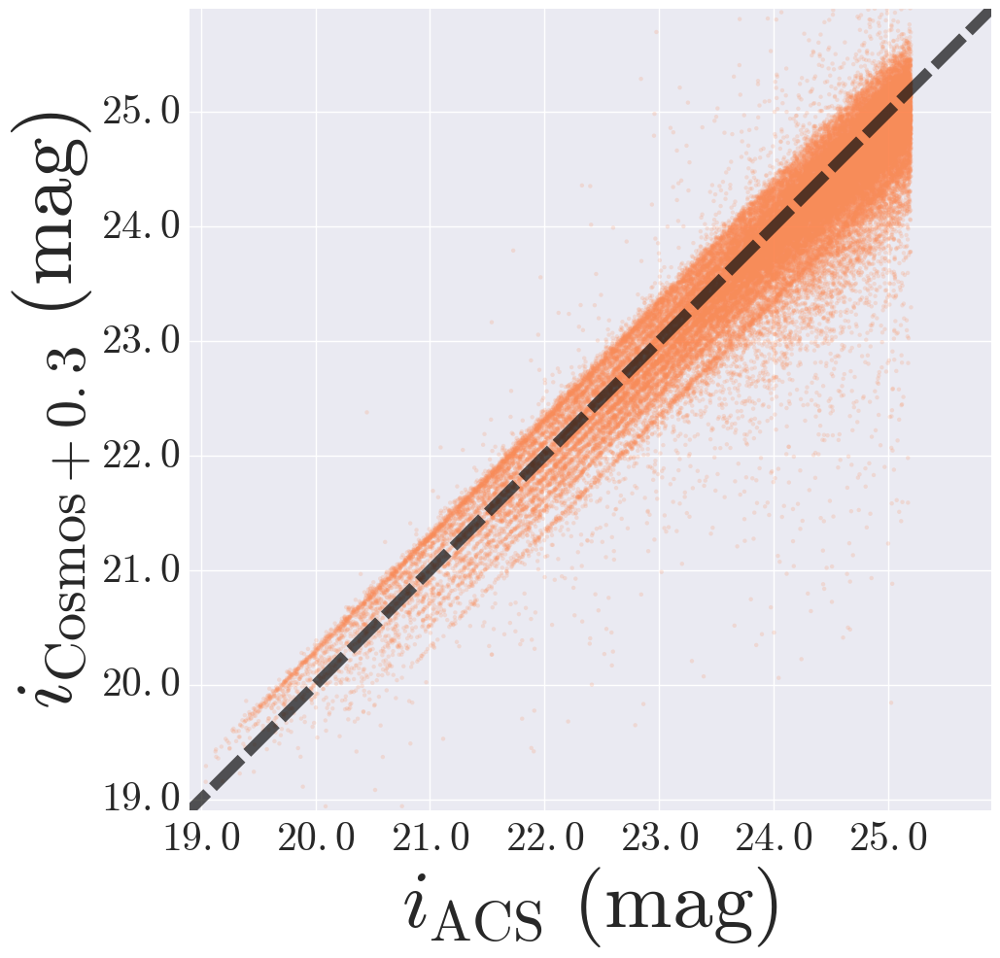

In [88]:
xx, yy = iAcs, iCos

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy+0.3, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
lin = np.linspace(15.0, 28.0, 100)
ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$i_{\mathrm{ACS}}\ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$i_{\mathrm{Cosmos}+0.3}\ (\mathrm{mag})$', size=60)


# X, Y limits
ax1.set_xlim(18.9, 25.9)
ax1.set_ylim(18.9, 25.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

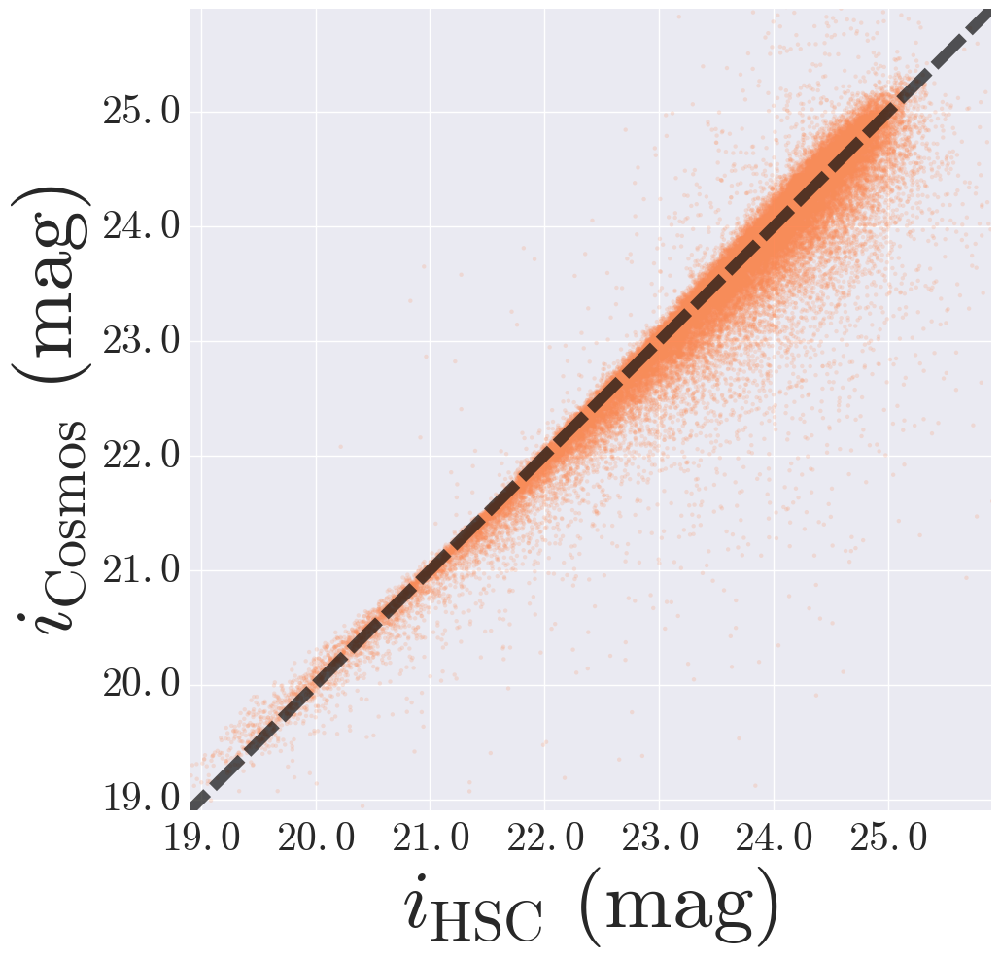

In [89]:
xx, yy = iHsc, iCos

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
lin = np.linspace(15.0, 28.0, 100)
ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$i_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$i_{\mathrm{Cosmos}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(18.9, 25.9)
ax1.set_ylim(18.9, 25.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

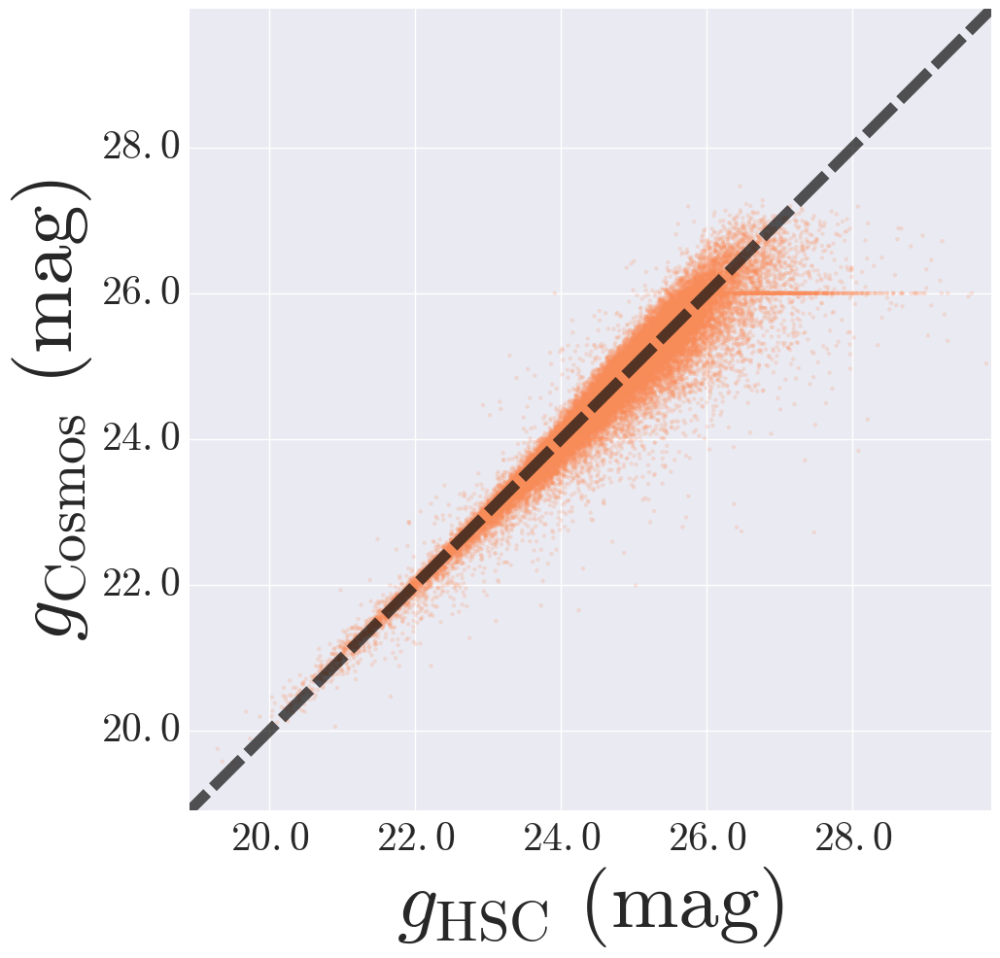

In [91]:
xx, yy = gHsc, gCos

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
lin = np.linspace(15.0, 30.0, 100)
ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$g_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$g_{\mathrm{Cosmos}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(18.9, 29.9)
ax1.set_ylim(18.9, 29.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

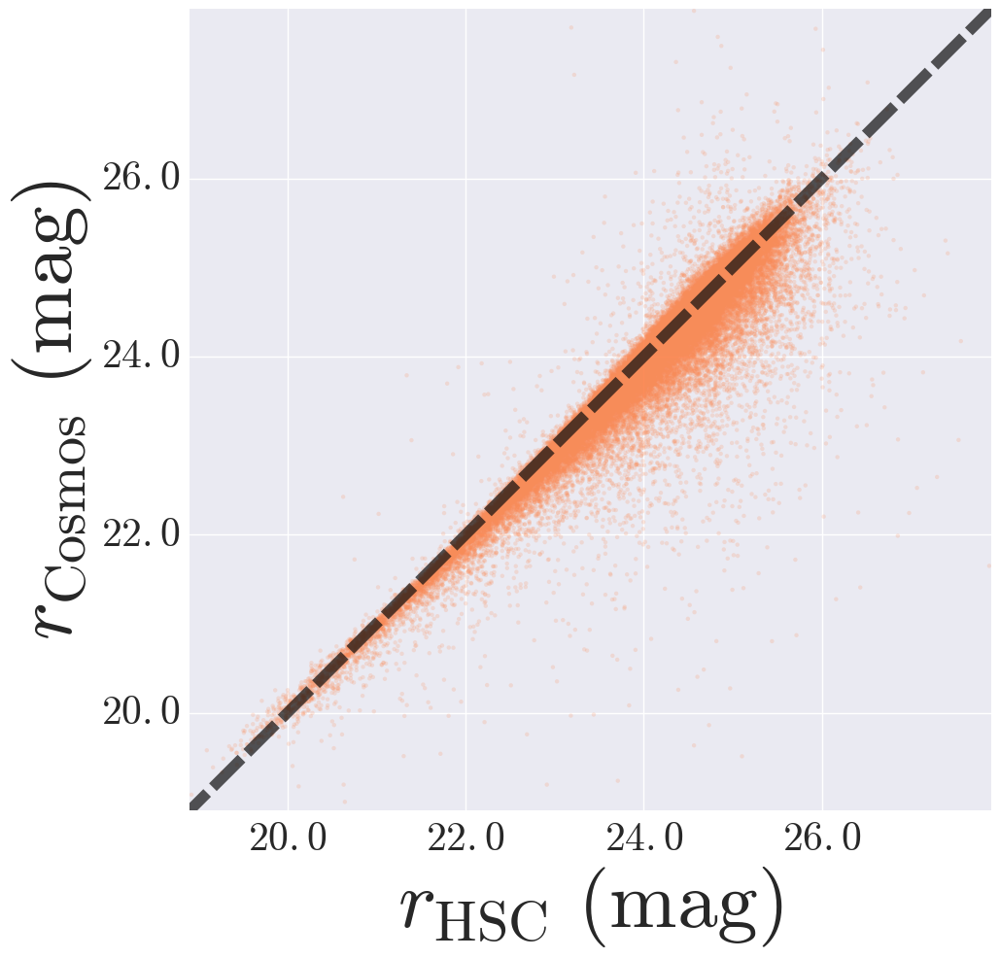

In [92]:
xx, yy = rHsc, rCos

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
lin = np.linspace(15.0, 28.0, 100)
ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$r_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$r_{\mathrm{Cosmos}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(18.9, 27.9)
ax1.set_ylim(18.9, 27.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

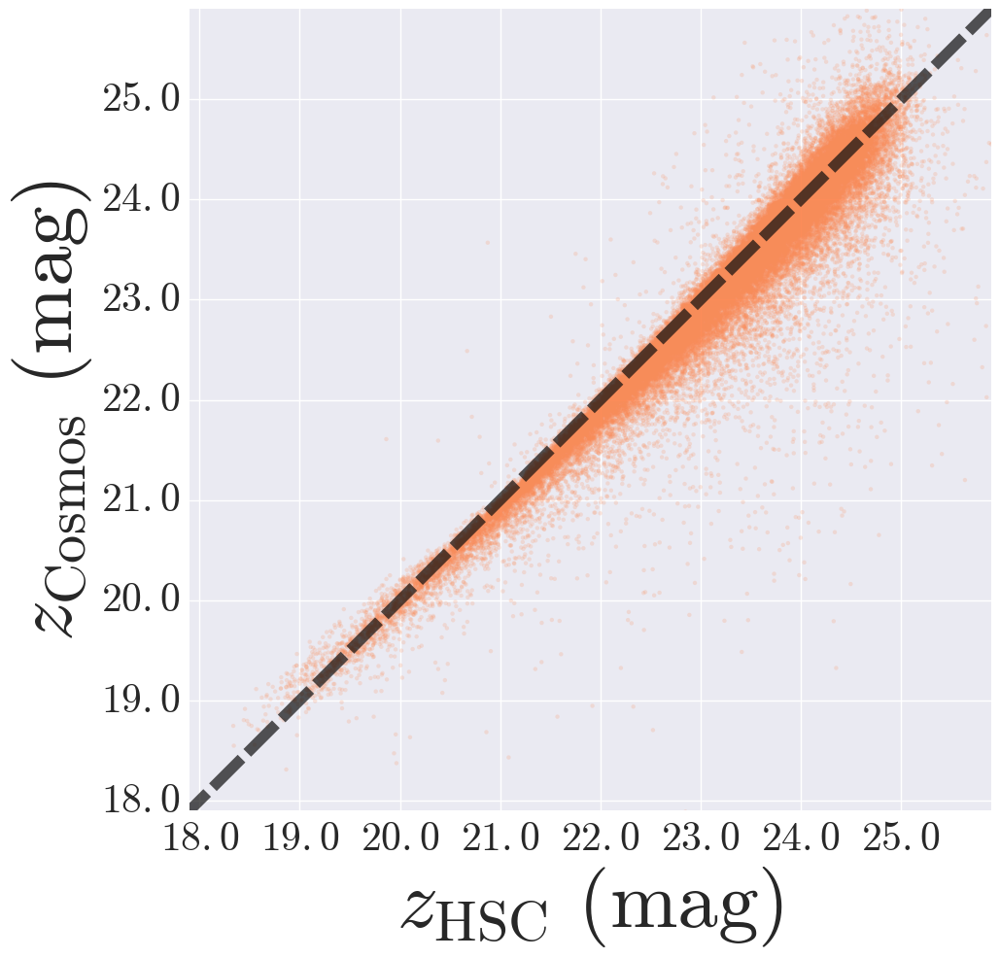

In [93]:
xx, yy = zHsc, zCos

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
lin = np.linspace(15.0, 28.0, 100)
ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$z_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$z_{\mathrm{Cosmos}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(17.9, 25.9)
ax1.set_ylim(17.9, 25.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

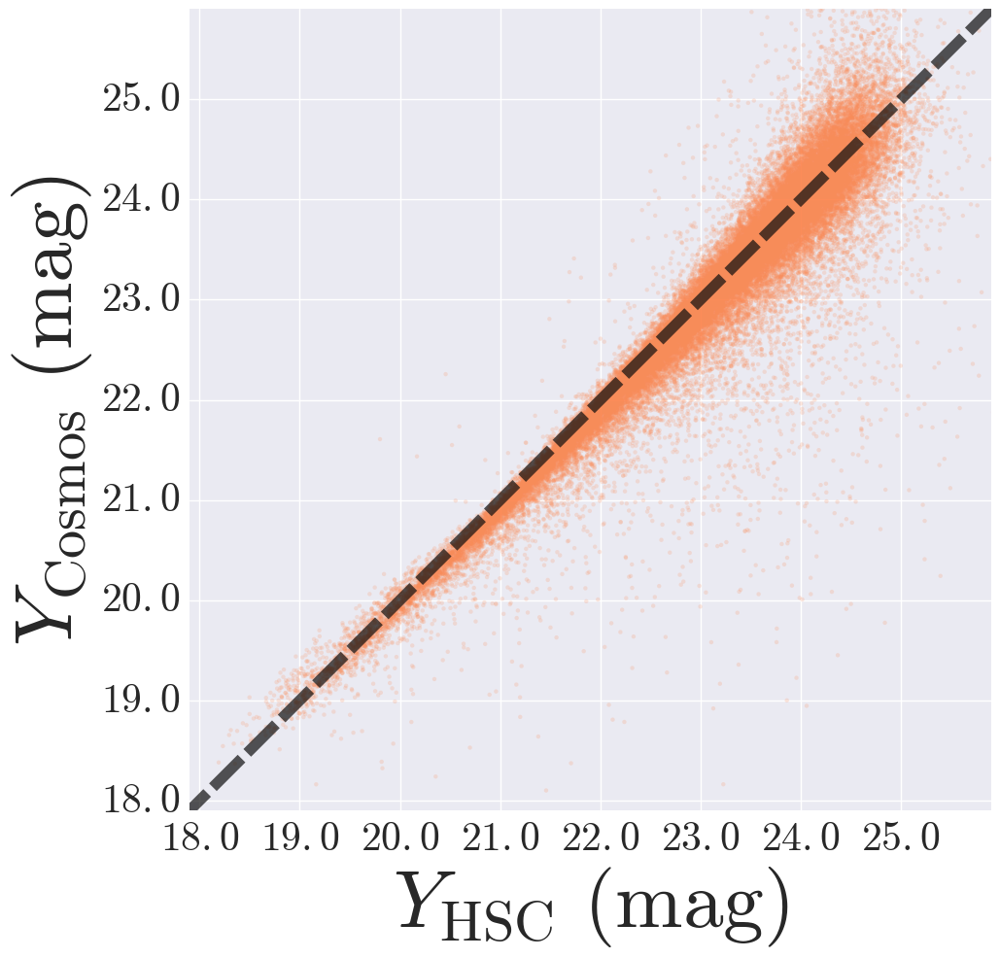

In [94]:
xx, yy = yHsc, yCos

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
lin = np.linspace(15.0, 28.0, 100)
ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$Y_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$Y_{\mathrm{Cosmos}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(17.9, 25.9)
ax1.set_ylim(17.9, 25.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

## Comparisons of colors

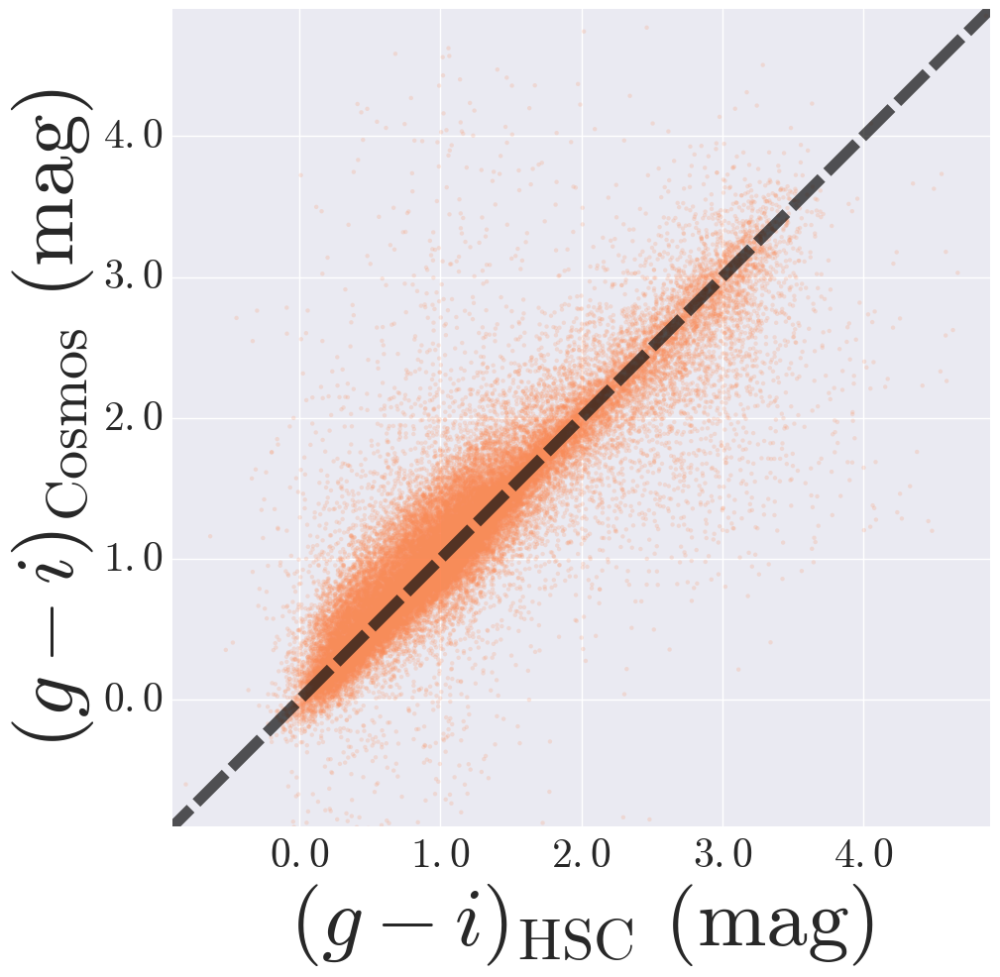

In [95]:
xx, yy = gHsc - iHsc, gCos - iCos 

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
lin = np.linspace(-5.0, 5.0, 100)
ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$(g-i)_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(g-i)_{\mathrm{Cosmos}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(-0.9, 4.9)
ax1.set_ylim(-0.9, 4.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

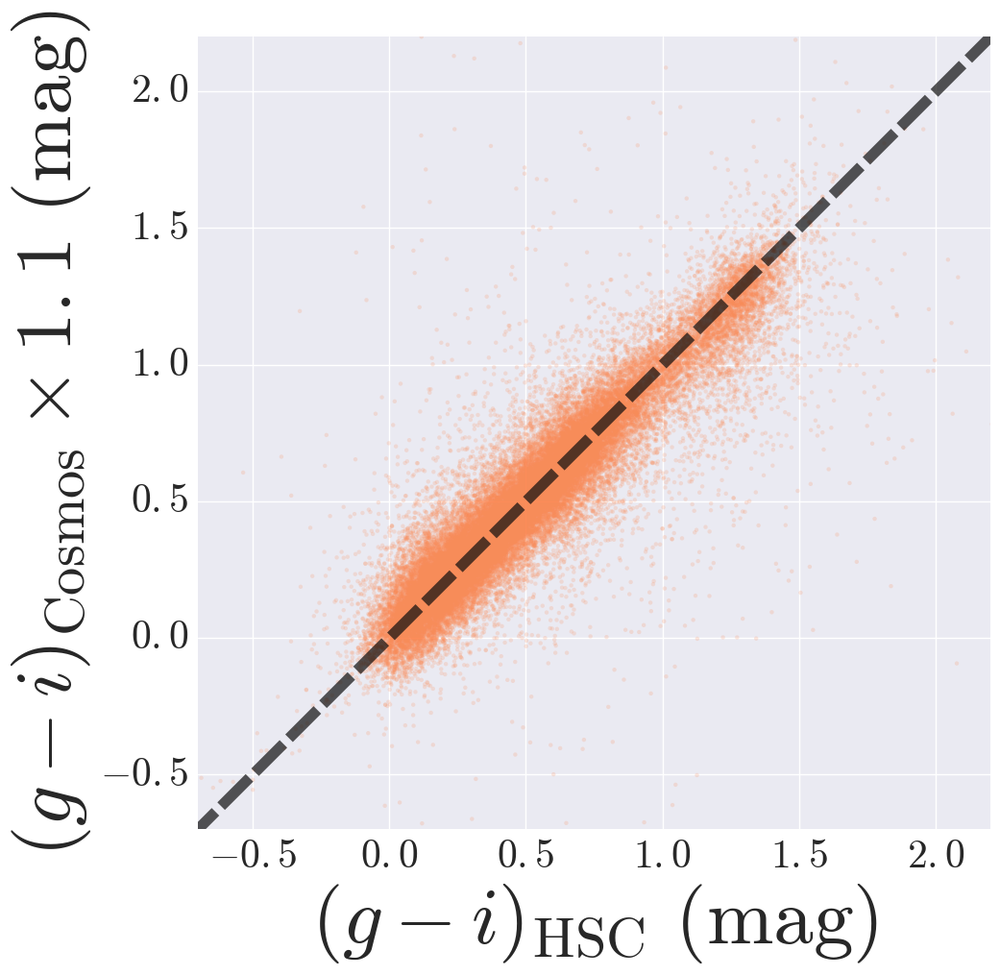

In [96]:
xx, yy = rHsc - iHsc, rCos - iCos 

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy*1.1, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
lin = np.linspace(-5.0, 5.0, 100)
ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$(g-i)_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(g-i)_{\mathrm{Cosmos}}\\times 1.1\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(-0.7, 2.2)
ax1.set_ylim(-0.7, 2.2)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

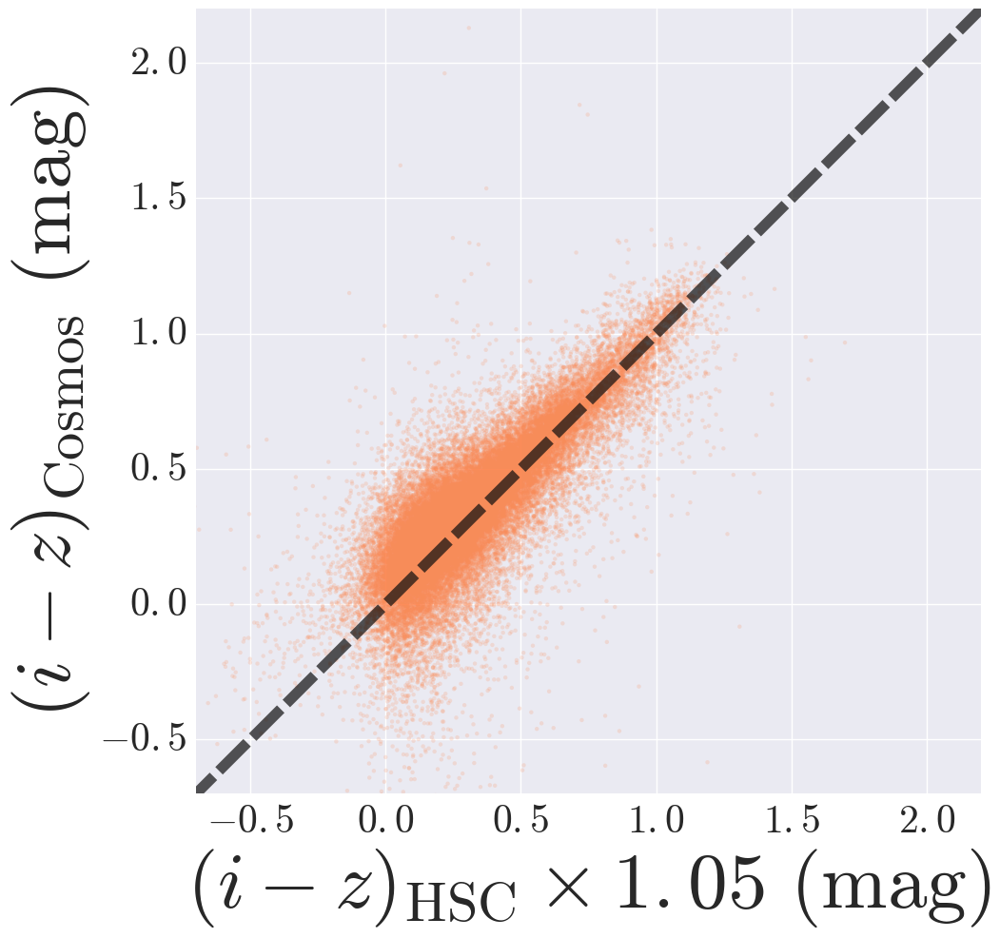

In [100]:
xx, yy = iHsc - zHsc, iCos - zCos 

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx*1.05, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
lin = np.linspace(-5.0, 5.0, 100)
ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$(i-z)_{\mathrm{HSC}}\\times 1.05 \ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(i-z)_{\mathrm{Cosmos}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(-0.7, 2.2)
ax1.set_ylim(-0.7, 2.2)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

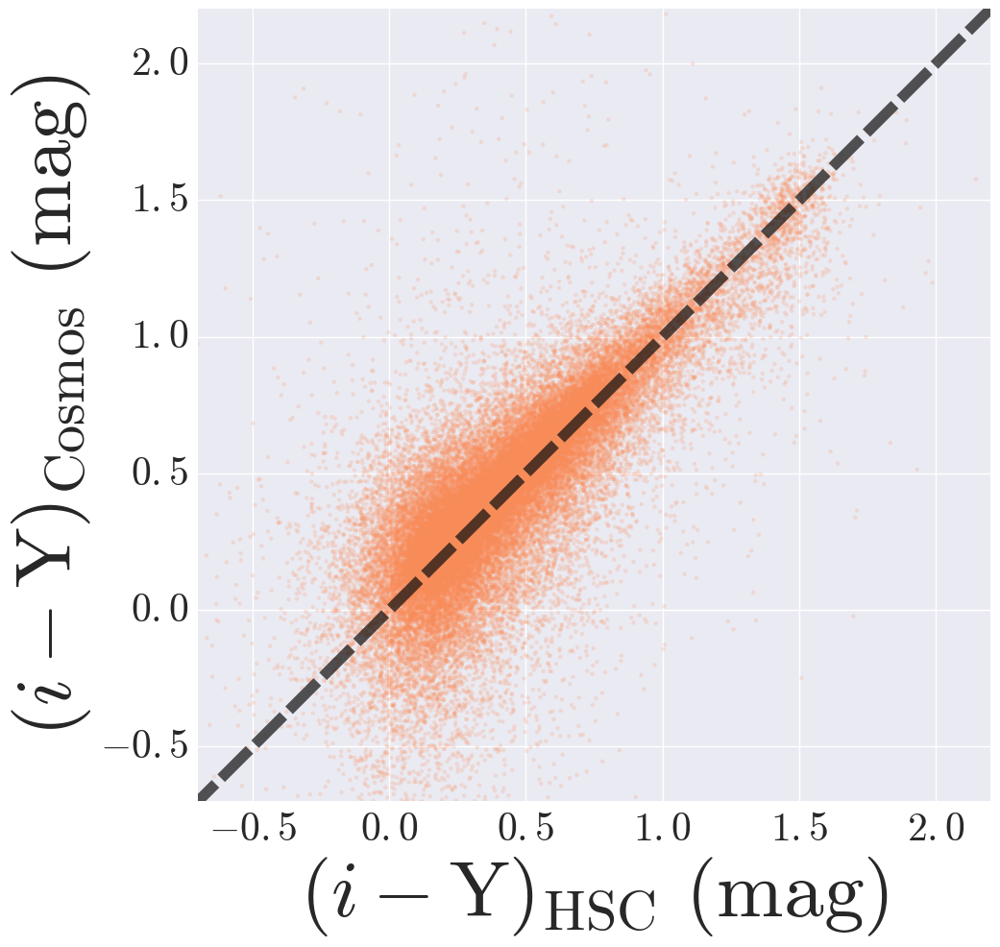

In [102]:
xx, yy = iHsc - yHsc, iCos - yCos 

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
lin = np.linspace(-5.0, 5.0, 100)
ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$(i-\mathrm{Y})_{\mathrm{HSC}} \ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(i-\mathrm{Y})_{\mathrm{Cosmos}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(-0.7, 2.2)
ax1.set_ylim(-0.7, 2.2)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

# Magnitude - Color relation

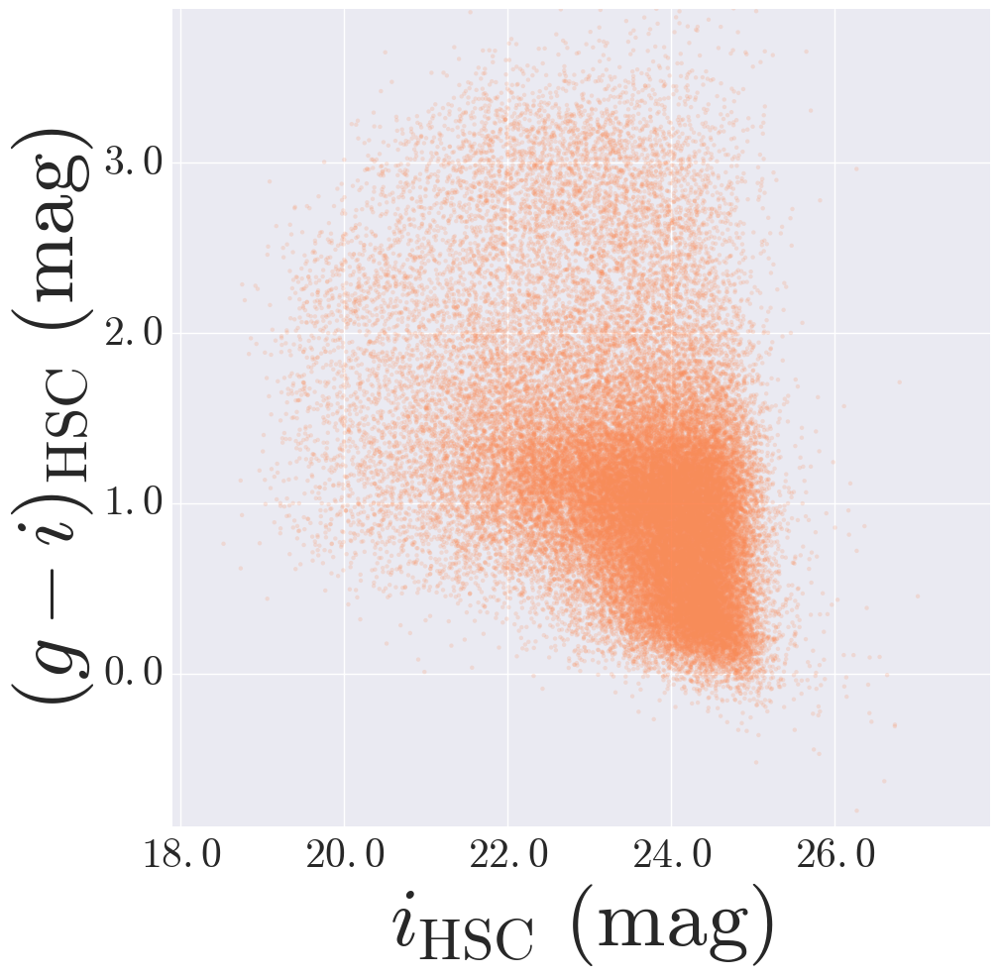

In [108]:
xx, yy = iHsc, gHsc - iHsc 

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
#lin = np.linspace(-5.0, 5.0, 100)
#ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
#         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$i_{\mathrm{HSC}} \ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(g-i)_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(17.9, 27.9)
ax1.set_ylim(-0.9, 3.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

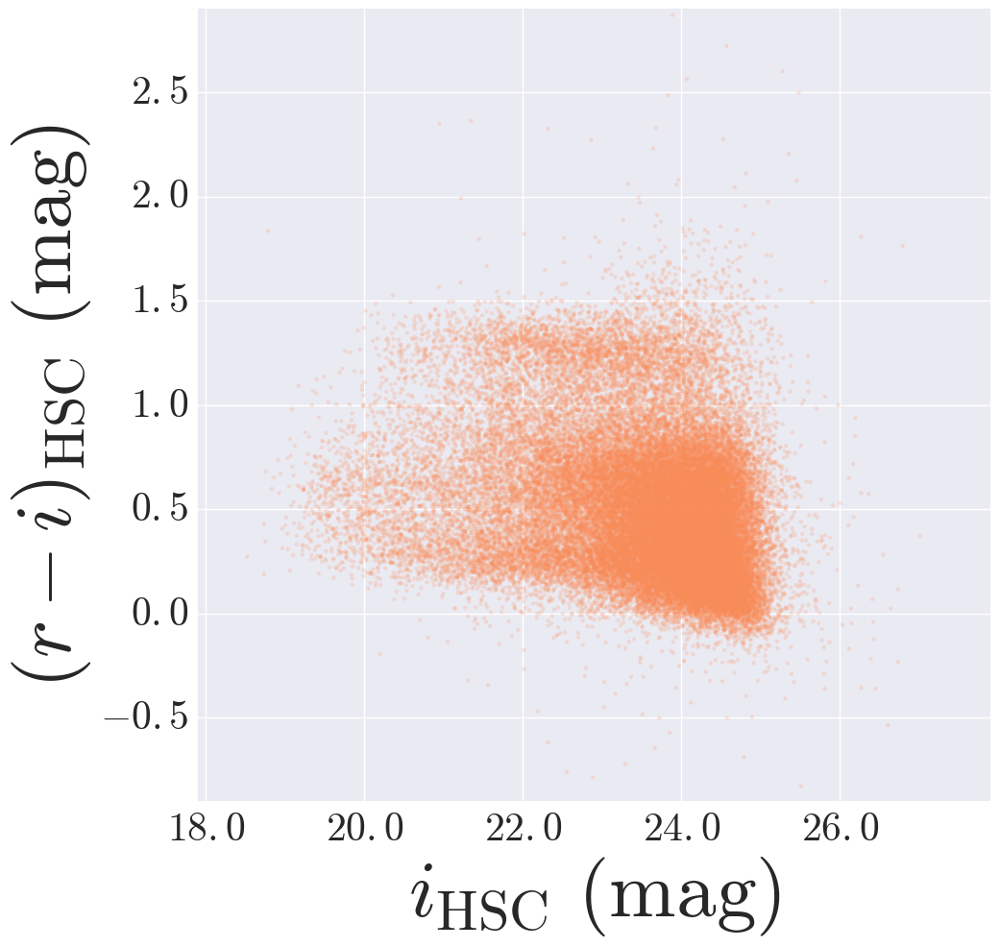

In [110]:
xx, yy = iHsc, rHsc - iHsc 

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
#lin = np.linspace(-5.0, 5.0, 100)
#ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
#         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$i_{\mathrm{HSC}} \ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(r-i)_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(17.9, 27.9)
ax1.set_ylim(-0.9, 2.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

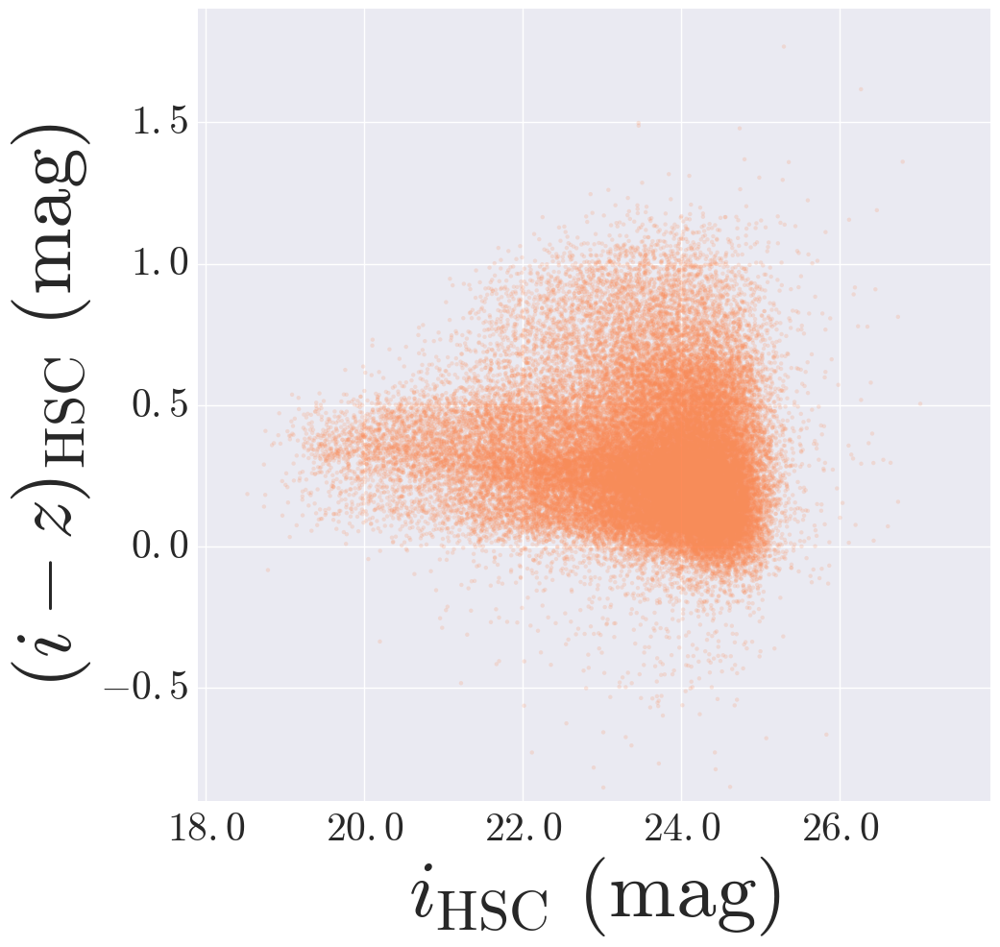

In [112]:
xx, yy = iHsc, iHsc - zHsc 

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
#lin = np.linspace(-5.0, 5.0, 100)
#ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
#         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$i_{\mathrm{HSC}} \ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(i-z)_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(17.9, 27.9)
ax1.set_ylim(-0.9, 1.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

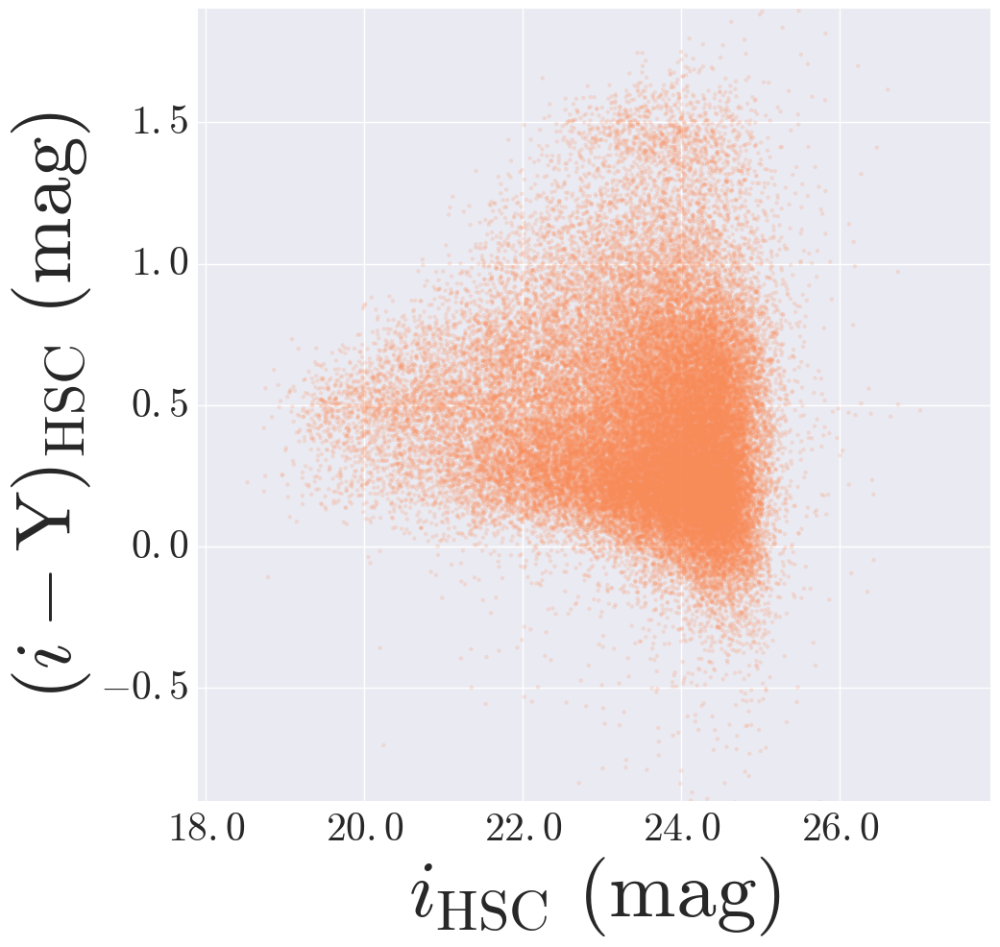

In [114]:
xx, yy = iHsc, iHsc - yHsc 

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
#lin = np.linspace(-5.0, 5.0, 100)
#ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
#         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$i_{\mathrm{HSC}} \ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(i-\mathrm{Y})_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(17.9, 27.9)
ax1.set_ylim(-0.9, 1.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

# Redshift - Color Relation

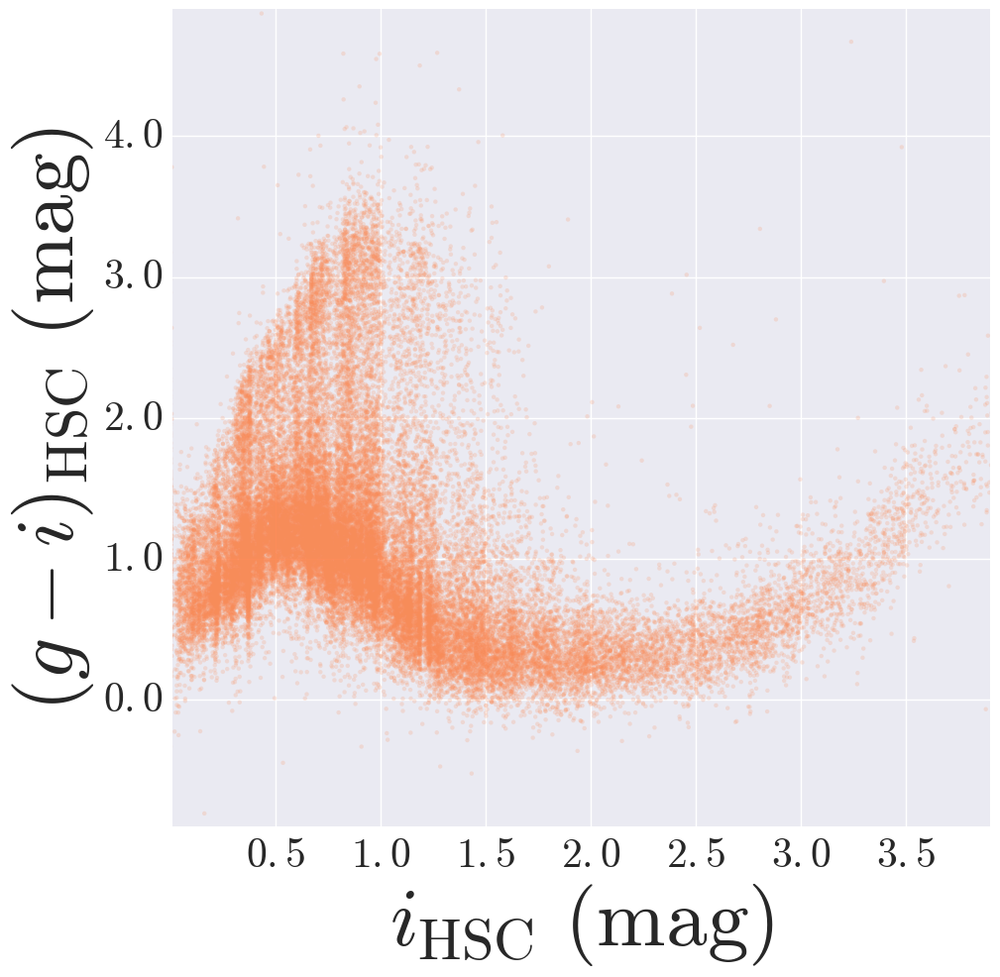

In [116]:
xx, yy = redCos, gHsc - iHsc 

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
#lin = np.linspace(-5.0, 5.0, 100)
#ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
#         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$i_{\mathrm{HSC}} \ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(g-i)_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(0.01, 3.9)
ax1.set_ylim(-0.9, 4.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

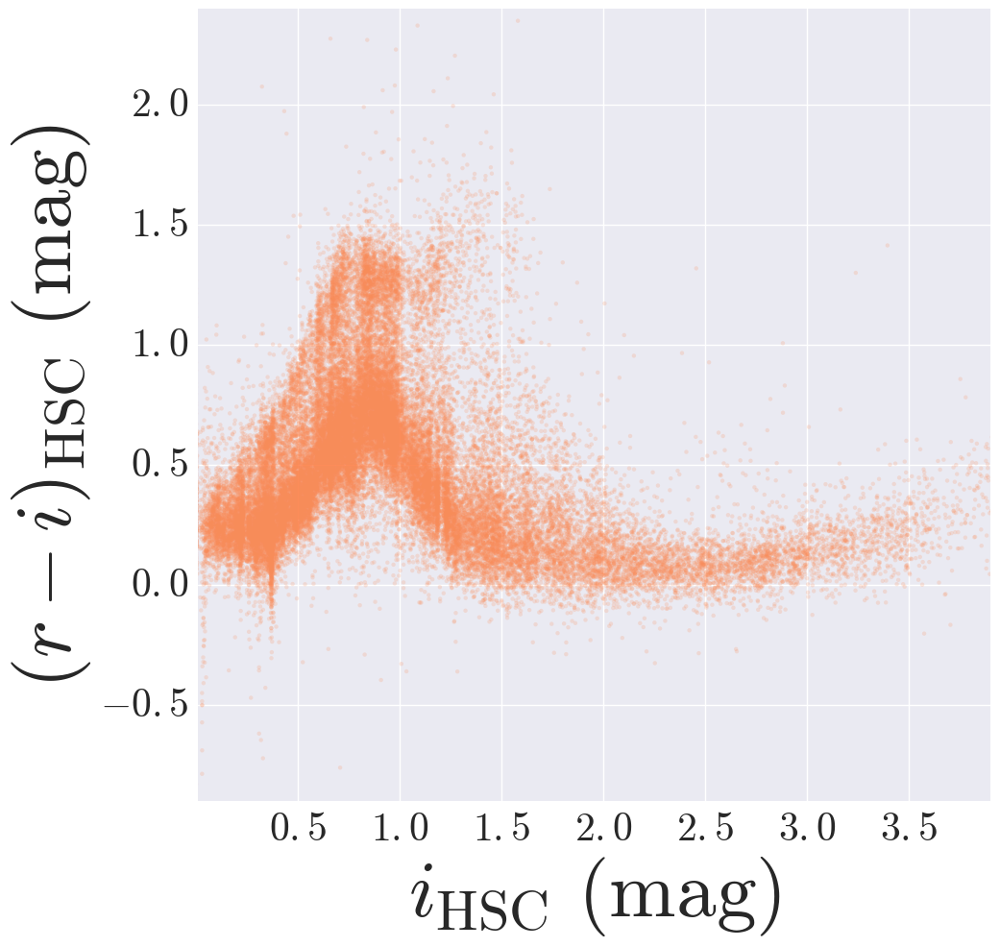

In [118]:
xx, yy = redCos, rHsc - iHsc 

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
#lin = np.linspace(-5.0, 5.0, 100)
#ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
#         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$i_{\mathrm{HSC}} \ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(r-i)_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(0.01, 3.9)
ax1.set_ylim(-0.9, 2.4)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

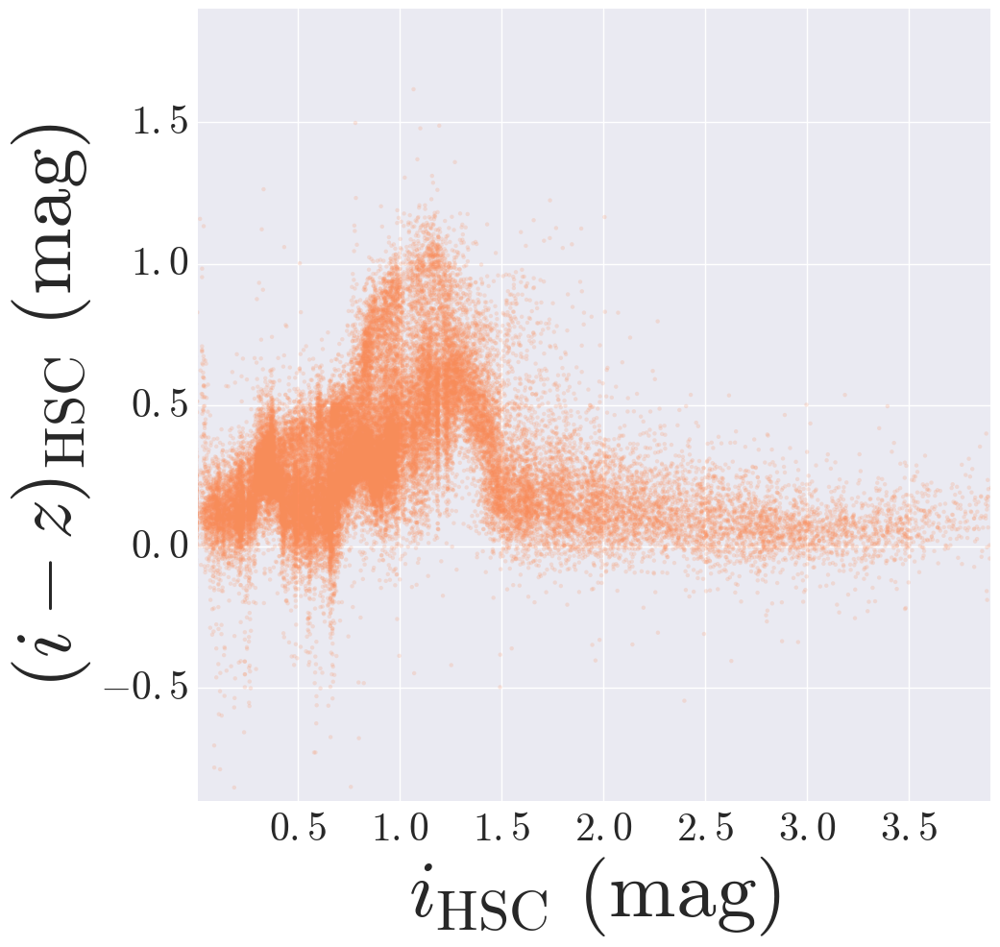

In [120]:
xx, yy = redCos, iHsc - zHsc 

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
#lin = np.linspace(-5.0, 5.0, 100)
#ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
#         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$i_{\mathrm{HSC}} \ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(i-z)_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(0.01, 3.9)
ax1.set_ylim(-0.9, 1.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

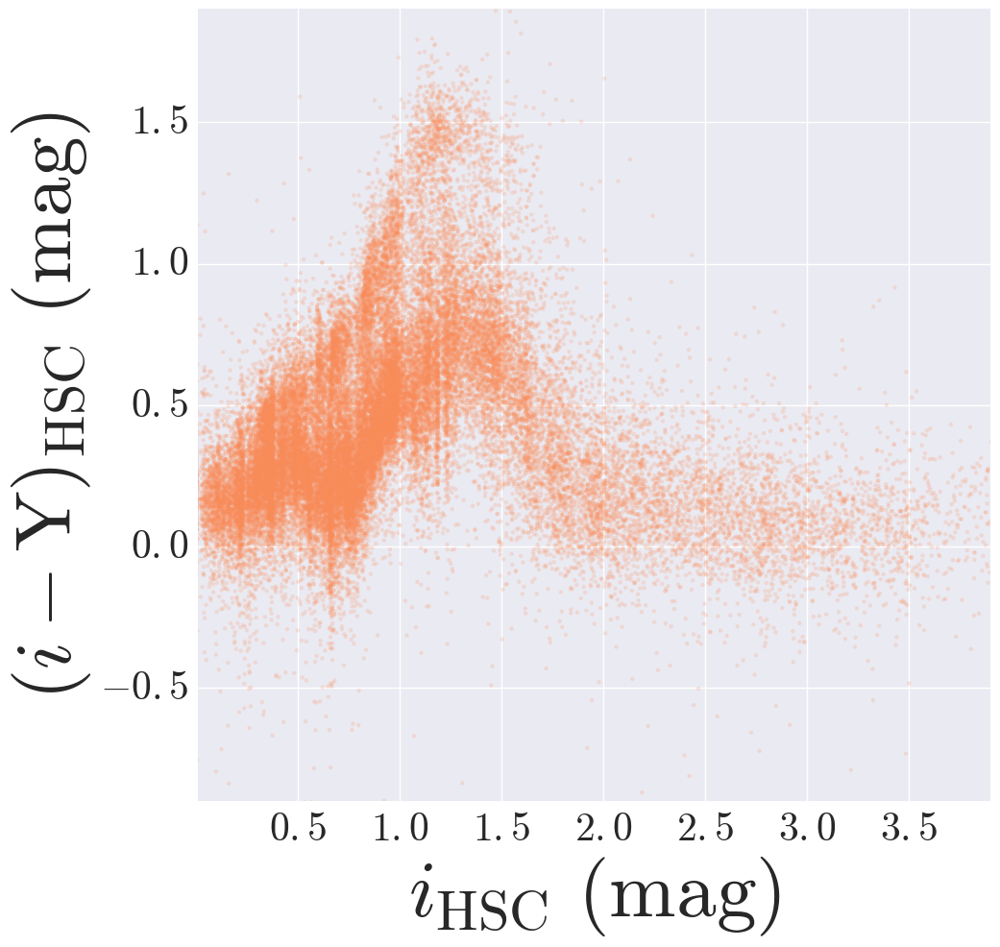

In [121]:
xx, yy = redCos, iHsc - yHsc 

#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)

#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')

ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)

# Scaling Relations
ax1.set_rasterization_zorder(0) 
#lin = np.linspace(-5.0, 5.0, 100)
#ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
#         linewidth=8.0, zorder=2, dashes=(30,6))

# X, Y Label
ax1.set_xlabel('$i_{\mathrm{HSC}} \ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(i-\mathrm{Y})_{\mathrm{HSC}}\ (\mathrm{mag})$', size=60)

# X, Y limits
ax1.set_xlim(0.01, 3.9)
ax1.set_ylim(-0.9, 1.9)

#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)

#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)

plt.show()

# Multiband magnitudes using average color

In [123]:
giMed = np.nanmedian(gHsc - iHsc)
riMed = np.nanmedian(rHsc - iHsc)
izMed = np.nanmedian(iHsc - zHsc)
iyMed = np.nanmedian(iHsc - yHsc)
print(giMed, riMed, izMed, iyMed)

1.02131451405 0.4493744189 0.27094790385 0.3739520346


In [126]:
magI = cosPho['mag']
magG = magI + giMed
magR = magI + riMed
magZ = magI - izMed
magY = magI - iyMed

cosMedColor = copy.deepcopy(cosHsc)
cosMedColor.add_column(Column(magI, name='mag_I'))
cosMedColor.add_column(Column(magG, name='mag_G'))
cosMedColor.add_column(Column(magR, name='mag_R'))
cosMedColor.add_column(Column(magZ, name='mag_Z'))
cosMedColor.add_column(Column(magY, name='mag_Y'))

In [127]:
cosMedColor.write('cosmos_mag25.2_shuang_multiband_medcolor.fits')

# Assign more reasonable colors

In [161]:
giPho = (gHsc - iHsc)
riPho = (rHsc - iHsc)
izPho = (iHsc - zHsc)
iyPho = (iHsc - yHsc)

giSig = np.nanstd(gHsc - iHsc)
riSig = np.nanstd(rHsc - iHsc)
izSig = np.nanstd(iHsc - zHsc)
iySig = np.nanstd(iCos - yCos)
print(giSig, riSig, izSig, iySig)

0.714387271979 0.345573004136 0.233620736419 1.98617


In [162]:
giNBad = len(giPho[(np.isnan(giPho)) | (giPho > 3.8) | (giPho < -0.2)])
giPho[(np.isnan(giPho)) | (giPho > 3.8) | (giPho < -0.2)] = np.random.normal(giMed, giSig, giNBad)

riNBad = len(riPho[(np.isnan(riPho)) | (riPho > 1.7) | (riPho < -0.2)])
riPho[(np.isnan(riPho)) | (riPho > 1.7) | (riPho < -0.2)] = np.random.normal(riMed, riSig, riNBad)

izNBad = len(izPho[(np.isnan(izPho)) | (izPho > 1.3) | (izPho < -0.2)])
izPho[(np.isnan(izPho)) | (izPho > 1.3) | (izPho < -0.2)] = np.random.normal(izMed, izSig, izNBad)

iyNBad = len(iyPho[(np.isnan(iyPho)) | (iyPho > 1.6) | (iyPho < -0.4)])
iyPho[(np.isnan(iyPho)) | (iyPho > 1.6) | (iyPho < -0.4)] = np.random.normal(iyMed, iySig, iyNBad)

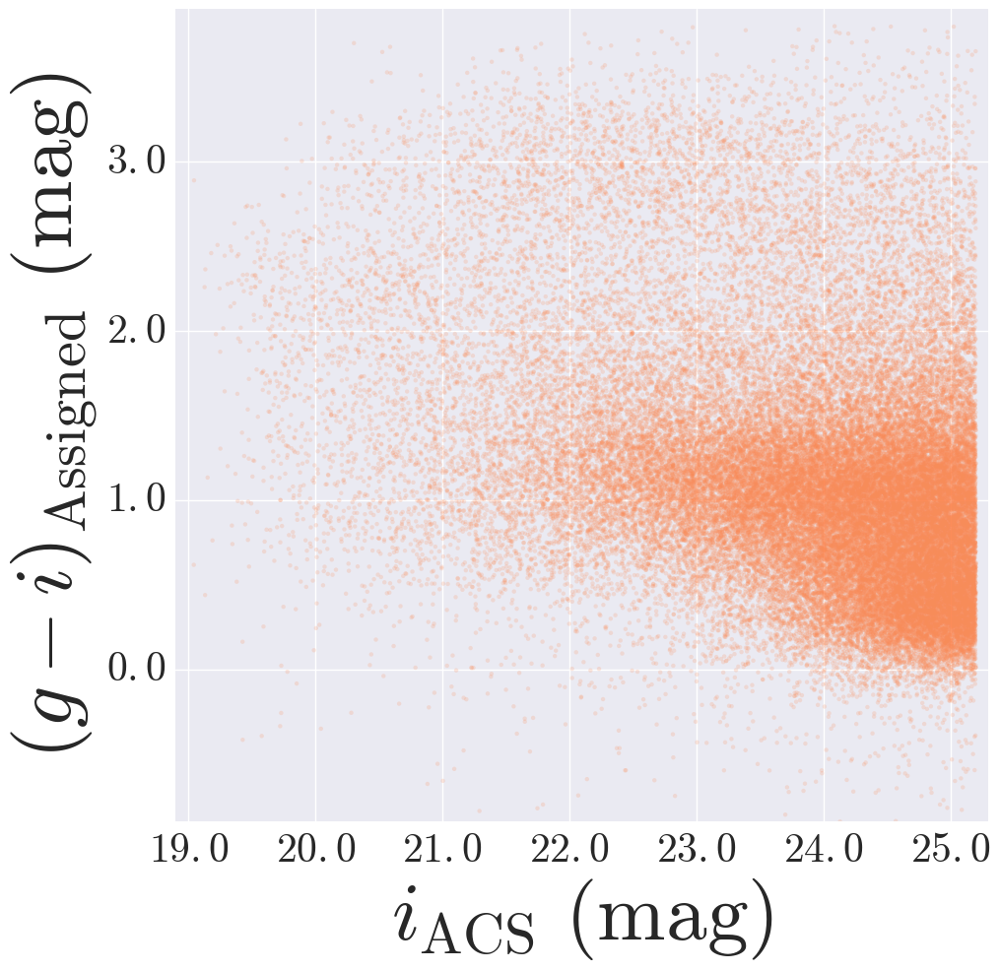

In [167]:
xx, yy = iAcs, giPho 
#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)
#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')
ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)
# Scaling Relations
ax1.set_rasterization_zorder(0) 
#lin = np.linspace(-5.0, 5.0, 100)
#ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
#         linewidth=8.0, zorder=2, dashes=(30,6))
# X, Y Label
ax1.set_xlabel('$i_{\mathrm{ACS}} \ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(g-i)_{\mathrm{Assigned}}\ (\mathrm{mag})$', size=60)
# X, Y limits
ax1.set_xlim(18.9, 25.3)
ax1.set_ylim(-0.9, 3.9)
#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)
#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)
plt.show()


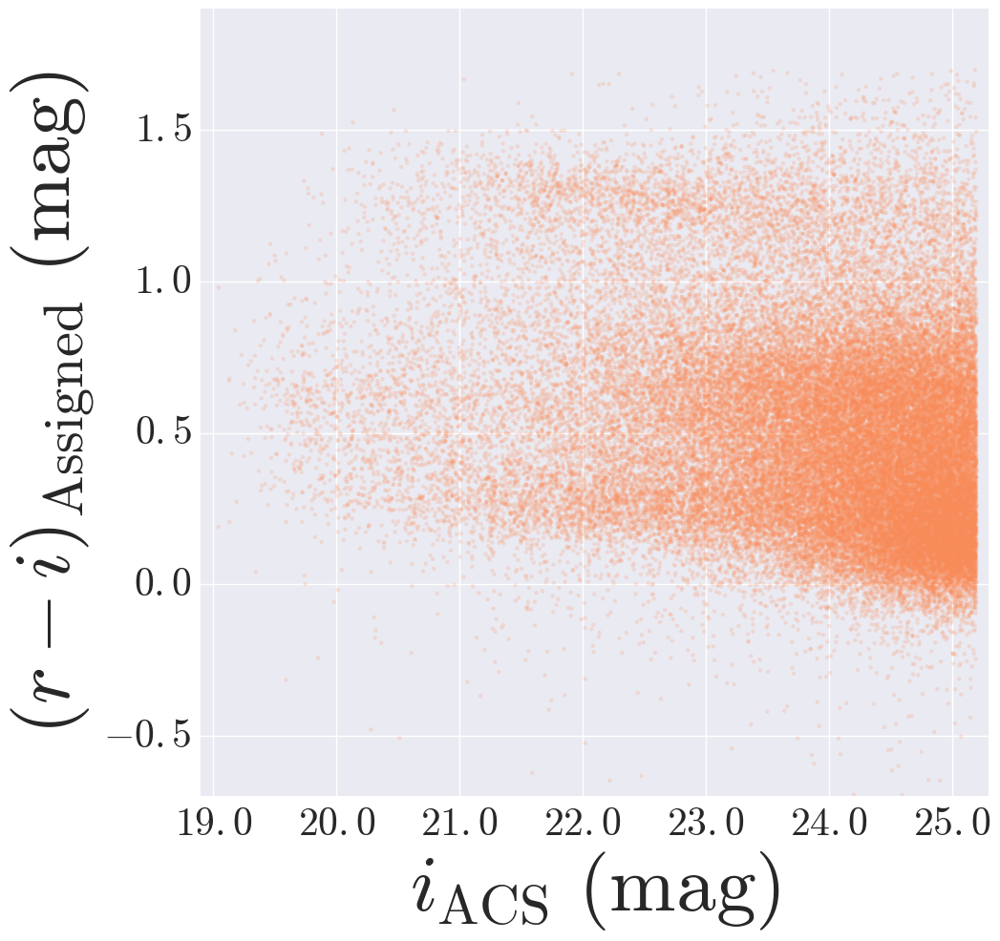

In [168]:
xx, yy = iAcs, riPho 
#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)
#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')
ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)
# Scaling Relations
ax1.set_rasterization_zorder(0) 
#lin = np.linspace(-5.0, 5.0, 100)
#ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
#         linewidth=8.0, zorder=2, dashes=(30,6))
# X, Y Label
ax1.set_xlabel('$i_{\mathrm{ACS}} \ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(r-i)_{\mathrm{Assigned}}\ (\mathrm{mag})$', size=60)
# X, Y limits
ax1.set_xlim(18.9, 25.3)
ax1.set_ylim(-0.7, 1.9)
#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)
#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)
plt.show()

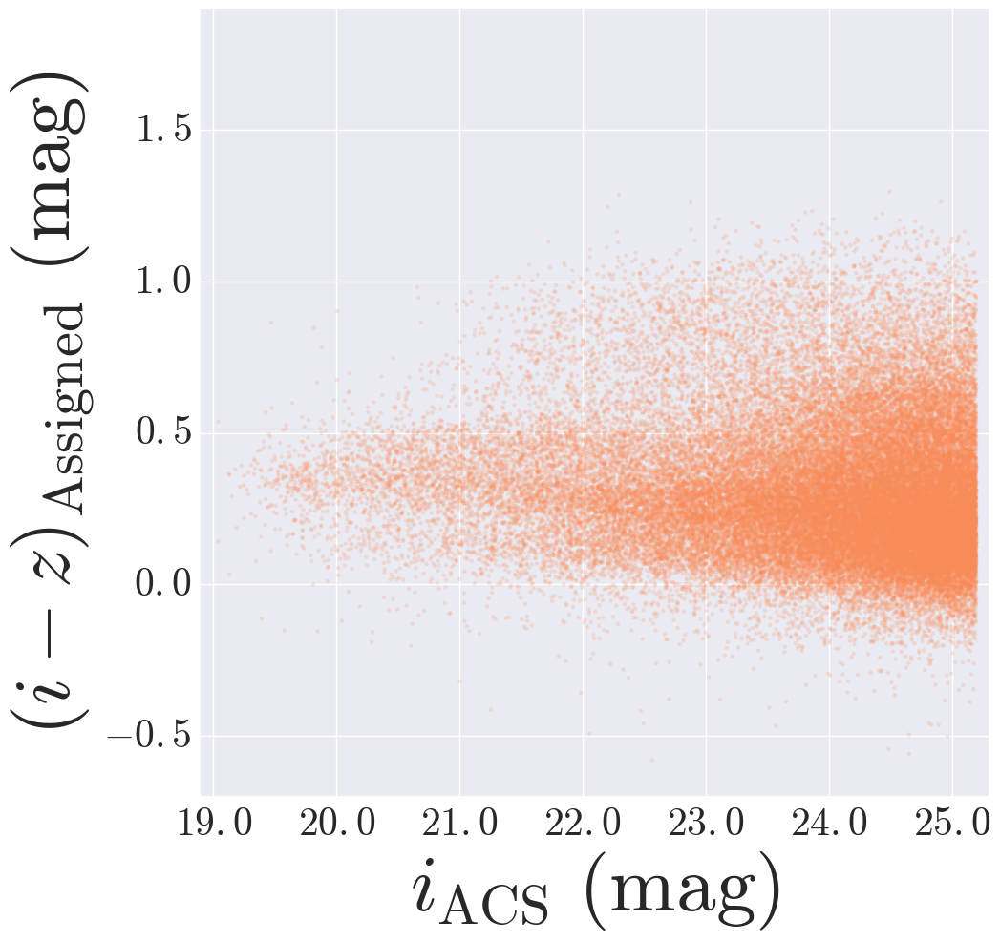

In [169]:
xx, yy = iAcs, izPho 
#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)
#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')
ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)
# Scaling Relations
ax1.set_rasterization_zorder(0) 
#lin = np.linspace(-5.0, 5.0, 100)
#ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
#         linewidth=8.0, zorder=2, dashes=(30,6))
# X, Y Label
ax1.set_xlabel('$i_{\mathrm{ACS}} \ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(i-z)_{\mathrm{Assigned}}\ (\mathrm{mag})$', size=60)
# X, Y limits
ax1.set_xlim(18.9, 25.3)
ax1.set_ylim(-0.7, 1.9)
#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)
#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)
plt.show()

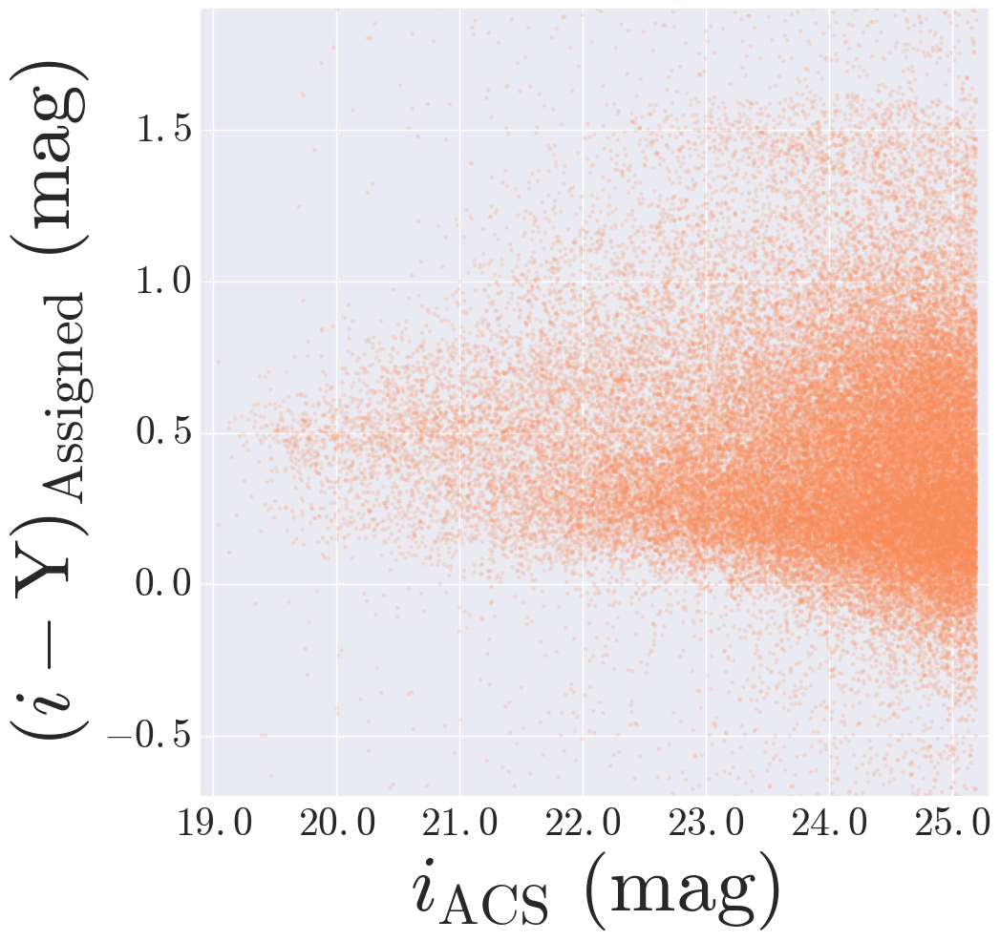

In [170]:
xx, yy = iAcs, iyPho 
#-----------------------------------------------------------------#
fig = plt.figure(figsize=(10, 10))
fig.subplots_adjust(left=0.17, right=0.995, 
                    bottom=0.17, top=0.995,
                    wspace=0.00, hspace=0.00)
#-----------------------------------------------------------------#
# logM100 - C82
ax1 = fig.add_subplot(111)
ax1 = songPlotSetup(ax1, xlabel=30, ylabel=30, border=0,
                    majorTickL=0, minorTickL=0,
                    majorTickW=0, minorTickW=0,
                    xtickFormat='$\mathrm{%4.1f}$', 
                    ytickFormat='$\mathrm{%4.1f}$')
ax1.scatter(xx, yy, marker='o', edgecolor='none', cmap=ORG, s=10,
            c=ORG(0.5), alpha=0.20, rasterized=True)
# Scaling Relations
ax1.set_rasterization_zorder(0) 
#lin = np.linspace(-5.0, 5.0, 100)
#ax1.plot(lin, lin, linestyle='--', color=BLK(0.95), alpha=0.7, 
#         linewidth=8.0, zorder=2, dashes=(30,6))
# X, Y Label
ax1.set_xlabel('$i_{\mathrm{ACS}} \ (\mathrm{mag})$', size=60)
ax1.set_ylabel('$(i-\mathrm{Y})_{\mathrm{Assigned}}\ (\mathrm{mag})$', size=60)
# X, Y limits
ax1.set_xlim(18.9, 25.3)
ax1.set_ylim(-0.7, 1.9)
#ax1.legend(loc=(0.03, 0.74),
#           shadow=True, fancybox=True, 
#           numpoints=1, fontsize=38, scatterpoints=1, 
#           markerscale=1.8, borderpad=0.3, handletextpad=0.5)
#-----------------------------------------------------------------#
#fig.savefig(os.path.join(figDir, 'redbcg_mass_r50.pdf'), dpi=150)
plt.show()

In [171]:
magI2 = cosPho['mag']
magG2 = magI2 + giPho
magR2 = magI2 + riPho
magZ2 = magI2 - izPho
magY2 = magI2 - iyPho

cosColor = copy.deepcopy(cosHsc)
cosColor.add_column(Column(magI2, name='mag_I'))
cosColor.add_column(Column(magG2, name='mag_G'))
cosColor.add_column(Column(magR2, name='mag_R'))
cosColor.add_column(Column(magZ2, name='mag_Z'))
cosColor.add_column(Column(magY2, name='mag_Y'))

In [172]:
cosColor.write('cosmos_mag25.2_shuang_multiband_phocolor.fits')

# Sample Summaries

In [5]:
inputG1 = Table.read(os.path.join(inDir, 'galaxy_all_8764_HSC-G.fits'), format='fits')
inputG2 = Table.read(os.path.join(inDir, 'galaxy_all_9699_HSC-G.fits'), format='fits')

inputR1 = Table.read(os.path.join(inDir, 'galaxy_all_8764_HSC-R.fits'), format='fits')
inputR2 = Table.read(os.path.join(inDir, 'galaxy_all_9699_HSC-R.fits'), format='fits')

inputI1 = Table.read(os.path.join(inDir, 'galaxy_all_8764_HSC-I.fits'), format='fits')
inputI2 = Table.read(os.path.join(inDir, 'galaxy_all_9699_HSC-I.fits'), format='fits')

inputZ1 = Table.read(os.path.join(inDir, 'galaxy_all_8764_HSC-Z.fits'), format='fits')
inputZ2 = Table.read(os.path.join(inDir, 'galaxy_all_9699_HSC-Z.fits'), format='fits')

inputY1 = Table.read(os.path.join(inDir, 'galaxy_all_8764_HSC-Y.fits'), format='fits')
inputY2 = Table.read(os.path.join(inDir, 'galaxy_all_9699_HSC-Y.fits'), format='fits')

In [15]:
print(len(inputG1))

40115


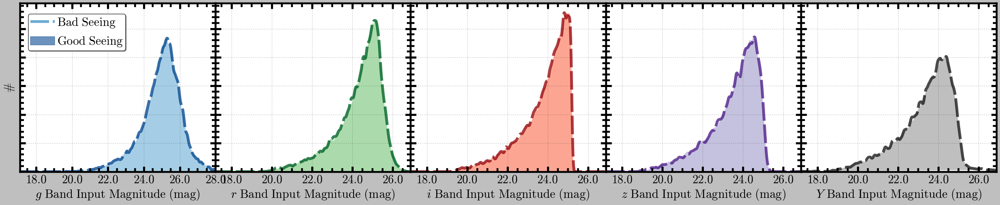

In [14]:
xtickFormat, ytickFormat = r'$\mathbf{%4.1f}$', r'$\mathbf{%4.1f}\ $'
ytickFormat2 = r'$\mathbf{%3.1f}$'

# --------------------------------------------------------------------------------------- #
## Setup up figure
fig = plt.figure(figsize=(30,6))
fig.subplots_adjust(left=0.02, right=0.99, bottom=0.15, top=0.99, 
                    hspace=0.0, wspace=0.0)

# --------------------------------------------------------------------------------------- #
## Ax1
ax1 = fig.add_subplot(151)
ax1.grid()
ax1 = songPlotSetup(ax1, ylabel=25, xlabel=25, border=4.0,
                    xtickFormat=xtickFormat, ytickFormat=ytickFormat)

## X, Y limits
xmin, xmax = 17.1, 27.99
ymin, ymax = -0.001, 0.589

# Good seeing
xx = inputI1['mag_G']
kde = KernelDensity(kernel='gaussian', bandwidth=0.05).fit(xx[:, None])
xPlot = np.linspace(xmin, 28.88, 500)
log_dens = kde.score_samples(xPlot[:, None])
ax1.fill(xPlot[:, None], np.exp(log_dens), facecolor=GCMAP(0.5), edgecolor=GCMAP(0.1), 
         alpha=0.6, linewidth=1.0, label=r'$\mathrm{Good\ Seeing}$')

# Bad seeing
xx = inputI2['mag_G']
kde = KernelDensity(kernel='gaussian', bandwidth=0.05).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
ax1.plot(xPlot, np.exp(log_dens), color=GCMAP(0.9), alpha=0.8, linewidth=6.0, 
         linestyle='--', dashes=(40,8), label=r'$\mathrm{Bad\ Seeing}$')

ax1.yaxis.set_major_formatter(NullFormatter())

xlabel = r'$g\ \mathrm{Band\ Input\ Magnitude\ (mag)}$'
ylabel = r'$\#$'
ax1.set_xlabel(xlabel, size=26)
ax1.set_ylabel(ylabel, size=26)

ax1.set_xlim(xmin, xmax)
ax1.set_ylim(ymin, ymax)

# --------------------------------------------------------------------------------------- #
## Legend
l_handles, l_labels = ax1.get_legend_handles_labels()
ax1.legend(l_handles, l_labels, loc=(0.04, 0.72), shadow=True, fancybox=True, 
           numpoints=1, fontsize=26, scatterpoints=1, 
           markerscale=1.2, borderpad=0.2, handletextpad=0.2)
legend = ax1.get_legend()
legend.legendHandles[0].set_color(GCMAP(0.6))
legend.legendHandles[1].set_color(GCMAP(0.9))
# --------------------------------------------------------------------------------------- #

# --------------------------------------------------------------------------------------- #
## Ax2
ax2 = fig.add_subplot(152)
ax2.grid()
ax2 = songPlotSetup(ax2, ylabel=25, xlabel=25, border=4.0,
                    xtickFormat=xtickFormat, ytickFormat=ytickFormat)

# Good seeing
xx = inputI1['mag_R']
kde = KernelDensity(kernel='gaussian', bandwidth=0.05).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
ax2.fill(xPlot[:, None], np.exp(log_dens), facecolor=RCMAP(0.5), edgecolor=RCMAP(0.1), 
         alpha=0.6, linewidth=1.0)

# Bad seeing
xx = inputI2['mag_R']
kde = KernelDensity(kernel='gaussian', bandwidth=0.05).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
ax2.plot(xPlot, np.exp(log_dens), color=RCMAP(0.9), alpha=0.8, linewidth=6.0, 
         linestyle='--', dashes=(40,8))

ax2.set_ylim(ax1.get_ylim())
ax2.yaxis.set_major_formatter(NullFormatter())

xlabel = r'$r\ \mathrm{Band\ Input\ Magnitude\ (mag)}$'
ax2.set_xlabel(xlabel, size=26)

## X, Y limits
xmin, xmax = 17.2, 26.9
ax2.set_xlim(xmin, xmax)

# --------------------------------------------------------------------------------------- #
## Ax3
ax3 = fig.add_subplot(153)
ax3.grid()
ax3 = songPlotSetup(ax3, ylabel=25, xlabel=25, border=4.0,
                    xtickFormat=xtickFormat, ytickFormat=ytickFormat)

# Good seeing
xx = inputI1['mag_I']
kde = KernelDensity(kernel='gaussian', bandwidth=0.05).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
ax3.fill(xPlot[:, None], np.exp(log_dens), facecolor=ICMAP(0.5), edgecolor=ICMAP(0.1), 
         alpha=0.6, linewidth=1.0)

# Bad seeing
xx = inputI2['mag_I']
kde = KernelDensity(kernel='gaussian', bandwidth=0.05).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
ax3.plot(xPlot, np.exp(log_dens), color=ICMAP(0.9), alpha=0.8, linewidth=6.0, 
         linestyle='--', dashes=(40,8))

ax3.set_ylim(ax1.get_ylim())
ax3.yaxis.set_major_formatter(NullFormatter())

xlabel = r'$i\ \mathrm{Band\ Input\ Magnitude\ (mag)}$'
ax3.set_xlabel(xlabel, size=26)

## X, Y limits
xmin, xmax = 17.2, 26.9
ax3.set_xlim(xmin, xmax)

# --------------------------------------------------------------------------------------- #
## Ax4
ax4 = fig.add_subplot(154)
ax4.grid()
ax4 = songPlotSetup(ax4, ylabel=25, xlabel=25, border=4.0,
                    xtickFormat=xtickFormat, ytickFormat=ytickFormat)

# Good seeing
xx = inputI1['mag_Z']
kde = KernelDensity(kernel='gaussian', bandwidth=0.05).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
ax4.fill(xPlot[:, None], np.exp(log_dens), facecolor=ZCMAP(0.5), edgecolor=ZCMAP(0.1), 
         alpha=0.6, linewidth=1.0)

# Bad seeing
xx = inputI2['mag_Z']
kde = KernelDensity(kernel='gaussian', bandwidth=0.05).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
ax4.plot(xPlot, np.exp(log_dens), color=ZCMAP(0.9), alpha=0.8, linewidth=6.0, 
         linestyle='--', dashes=(40,8))

ax4.set_ylim(ax1.get_ylim())
ax4.yaxis.set_major_formatter(NullFormatter())

xlabel = r'$z\ \mathrm{Band\ Input\ Magnitude\ (mag)}$'
ax4.set_xlabel(xlabel, size=26)

## X, Y limits
xmin, xmax = 17.2, 26.9
ax4.set_xlim(xmin, xmax)

# --------------------------------------------------------------------------------------- #
## Ax5
ax5 = fig.add_subplot(155)
ax5.grid()
ax5 = songPlotSetup(ax5, ylabel=25, xlabel=25, border=4.0,
                    xtickFormat=xtickFormat, ytickFormat=ytickFormat)

# Good seeing
xx = inputI1['mag_Y']
kde = KernelDensity(kernel='gaussian', bandwidth=0.05).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
ax5.fill(xPlot[:, None], np.exp(log_dens), facecolor=YCMAP(0.5), edgecolor=YCMAP(0.1), 
         alpha=0.6, linewidth=1.0)

# Bad seeing
xx = inputI2['mag_Y']
kde = KernelDensity(kernel='gaussian', bandwidth=0.05).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
ax5.plot(xPlot, np.exp(log_dens), color=YCMAP(0.9), alpha=0.8, linewidth=6.0, 
         linestyle='--', dashes=(40,8))

ax5.set_ylim(ax1.get_ylim())
ax5.yaxis.set_major_formatter(NullFormatter())

xlabel = r'$Y\ \mathrm{Band\ Input\ Magnitude\ (mag)}$'
ax5.set_xlabel(xlabel, size=26)

## X, Y limits
xmin, xmax = 17.2, 26.9
ax5.set_xlim(xmin, xmax)

# --------------------------------------------------------------------------------------- #
fig.savefig(os.path.join(figDir, 'cosmos_galaxy_mag_hist_1.pdf'), 
            format='pdf', dpi=90)

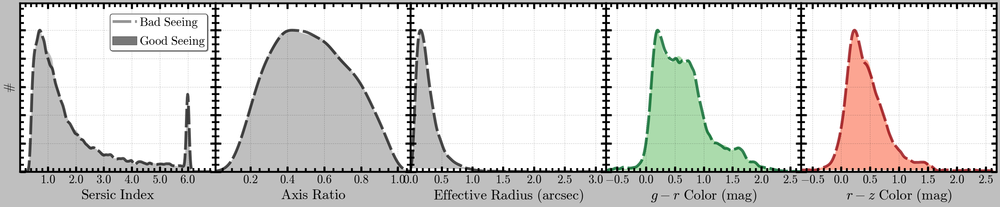

In [13]:
xtickFormat, ytickFormat = r'$\mathbf{%4.1f}$', r'$\mathbf{%4.1f}\ $'
ytickFormat2 = r'$\mathbf{%3.1f}$'

# --------------------------------------------------------------------------------------- #
## Setup up figure
fig = plt.figure(figsize=(30,6))
fig.subplots_adjust(left=0.02, right=0.99, bottom=0.15, top=0.99, 
                    hspace=0.0, wspace=0.0)

# --------------------------------------------------------------------------------------- #
## Ax1
ax1 = fig.add_subplot(151)
ax1.grid()
ax1 = songPlotSetup(ax1, ylabel=25, xlabel=25, border=4.0,
                    xtickFormat=xtickFormat, ytickFormat=ytickFormat)

## X, Y limits
xmin, xmax = 0.01, 6.99
ymin, ymax = -0.001, 1.19

# Good seeing
xx = inputI1['sersic_n']
kde = KernelDensity(kernel='gaussian', bandwidth=0.05).fit(xx[:, None])
xPlot = np.linspace(xmin, 28.88, 500)
log_dens = kde.score_samples(xPlot[:, None])
yden = np.exp(log_dens)
yden /= np.nanmax(yden)
ax1.fill(xPlot[:, None], yden, facecolor=YCMAP(0.5), edgecolor=YCMAP(0.1), 
         alpha=0.6, linewidth=1.0, label=r'$\mathrm{Good\ Seeing}$')

# Bad seeing
xx = inputI2['sersic_n']
kde = KernelDensity(kernel='gaussian', bandwidth=0.05).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
yden = np.exp(log_dens)
yden /= np.nanmax(yden)
ax1.plot(xPlot, yden, color=YCMAP(0.9), alpha=0.8, linewidth=6.0, 
         linestyle='--', dashes=(40,8), label=r'$\mathrm{Bad\ Seeing}$')

ax1.yaxis.set_major_formatter(NullFormatter())

xlabel = r'$\mathrm{Sersic\ Index}$'
ylabel = r'$\#$'
ax1.set_xlabel(xlabel, size=30)
ax1.set_ylabel(ylabel, size=26)

ax1.set_xlim(xmin, xmax)
ax1.set_ylim(ymin, ymax)

# --------------------------------------------------------------------------------------- #
## Legend
l_handles, l_labels = ax1.get_legend_handles_labels()
ax1.legend(l_handles, l_labels, loc=(0.46, 0.72), shadow=True, fancybox=True, 
           numpoints=1, fontsize=26, scatterpoints=1, 
           markerscale=1.2, borderpad=0.2, handletextpad=0.2)
legend = ax1.get_legend()
legend.legendHandles[0].set_color(YCMAP(0.6))
legend.legendHandles[1].set_color(YCMAP(0.9))
# --------------------------------------------------------------------------------------- #

# --------------------------------------------------------------------------------------- #
## Ax2
ax2 = fig.add_subplot(152)
ax2.grid()
ax2 = songPlotSetup(ax2, ylabel=25, xlabel=25, border=4.0,
                    xtickFormat=xtickFormat, ytickFormat=ytickFormat)

## X, Y limits
xmin, xmax = 0.01, 1.07
ax2.set_xlim(xmin, xmax)

# Good seeing
xx = inputI1['b_a']
kde = KernelDensity(kernel='gaussian', bandwidth=0.04).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
yden = np.exp(log_dens)
yden /= np.nanmax(yden)
ax2.fill(xPlot[:, None], yden, facecolor=YCMAP(0.5), edgecolor=YCMAP(0.1), 
         alpha=0.6, linewidth=1.0)

# Bad seeing
xx = inputI2['b_a']
kde = KernelDensity(kernel='gaussian', bandwidth=0.04).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
yden = np.exp(log_dens)
yden /= np.nanmax(yden)
ax2.plot(xPlot, yden, color=YCMAP(0.9), alpha=0.8, linewidth=6.0, 
         linestyle='--', dashes=(40,8))

ax2.set_ylim(ax1.get_ylim())
ax2.yaxis.set_major_formatter(NullFormatter())

xlabel = r'$\mathrm{Axis\ Ratio}$'
ax2.set_xlabel(xlabel, size=30)

# --------------------------------------------------------------------------------------- #
## Ax3
ax3 = fig.add_subplot(153)
ax3.grid()
ax3 = songPlotSetup(ax3, ylabel=25, xlabel=25, border=4.0,
                    xtickFormat=xtickFormat, ytickFormat=ytickFormat)

## X, Y limits
xmin, xmax = 0.001, 3.17
ax3.set_xlim(xmin, xmax)

# Good seeing
xx = inputI1['reff']
xx = xx[(xx <= 4.00) & (xx >= 0.02)]
kde = KernelDensity(kernel='gaussian', bandwidth=0.03).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
yden = np.exp(log_dens)
yden /= np.nanmax(yden)
ax3.fill(xPlot[:, None], yden, facecolor=YCMAP(0.5), edgecolor=YCMAP(0.1), 
         alpha=0.6, linewidth=1.0)

# Bad seeing
xx = inputI2['reff']
xx = xx[xx <= 4.00]
kde = KernelDensity(kernel='gaussian', bandwidth=0.03).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
yden = np.exp(log_dens)
yden /= np.nanmax(yden)
ax3.plot(xPlot, yden, color=YCMAP(0.9), alpha=0.8, linewidth=6.0, 
         linestyle='--', dashes=(40,8))

ax3.set_ylim(ax1.get_ylim())
ax3.yaxis.set_major_formatter(NullFormatter())

xlabel = r'$\mathrm{Effective\ Radius\ (arcsec)}$'
ax3.set_xlabel(xlabel, size=30)

# --------------------------------------------------------------------------------------- #
## Ax4
ax4 = fig.add_subplot(154)
ax4.grid()
ax4 = songPlotSetup(ax4, ylabel=25, xlabel=25, border=4.0,
                    xtickFormat=xtickFormat, ytickFormat=ytickFormat)

## X, Y limits
xmin, xmax = -0.69, 2.69
ax4.set_xlim(xmin, xmax)

# Good seeing
xx = inputI1['mag_G'] - inputI1['mag_R']
kde = KernelDensity(kernel='gaussian', bandwidth=0.03).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
yden = np.exp(log_dens)
yden /= np.nanmax(yden)
ax4.fill(xPlot[:, None], yden, facecolor=RCMAP(0.5), edgecolor=RCMAP(0.1), 
         alpha=0.6, linewidth=1.0)

# Bad seeing
xx = inputI2['mag_G'] - inputI2['mag_R']
kde = KernelDensity(kernel='gaussian', bandwidth=0.03).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
yden = np.exp(log_dens)
yden /= np.nanmax(yden)
ax4.plot(xPlot, yden, color=RCMAP(0.9), alpha=0.8, linewidth=6.0, 
         linestyle='--', dashes=(40,8))

ax4.set_ylim(ax1.get_ylim())
ax4.yaxis.set_major_formatter(NullFormatter())

xlabel = r'$g-r \ \mathrm{Color\ (mag)}$'
ax4.set_xlabel(xlabel, size=30)

# --------------------------------------------------------------------------------------- #
## Ax5
ax5 = fig.add_subplot(155)
ax5.grid()
ax5 = songPlotSetup(ax5, ylabel=25, xlabel=25, border=4.0,
                    xtickFormat=xtickFormat, ytickFormat=ytickFormat)

## X, Y limits
xmin, xmax = -0.69, 2.69
ax5.set_xlim(xmin, xmax)

# Good seeing
xx = inputI1['mag_I'] - inputI1['mag_Y']
kde = KernelDensity(kernel='gaussian', bandwidth=0.03).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
yden = np.exp(log_dens)
yden /= np.nanmax(yden)
ax5.fill(xPlot[:, None], yden, facecolor=ICMAP(0.5), edgecolor=ICMAP(0.1), 
         alpha=0.6, linewidth=1.0)

# Bad seeing
xx = inputI2['mag_I'] - inputI2['mag_Y']
kde = KernelDensity(kernel='gaussian', bandwidth=0.03).fit(xx[:, None])
xPlot = np.linspace(xmin, xmax, 500)
log_dens = kde.score_samples(xPlot[:, None])
yden = np.exp(log_dens)
yden /= np.nanmax(yden)
ax5.plot(xPlot, yden, color=ICMAP(0.9), alpha=0.8, linewidth=6.0, 
         linestyle='--', dashes=(40,8))

ax5.set_ylim(ax1.get_ylim())
ax5.yaxis.set_major_formatter(NullFormatter())

xlabel = r'$r-z \ \mathrm{Color\ (mag)}$'
ax5.set_xlabel(xlabel, size=30)

# --------------------------------------------------------------------------------------- #
fig.savefig(os.path.join(figDir, 'cosmos_galaxy_sample_hist_1.pdf'), 
            format='pdf', dpi=90)